In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Progress 1


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from skimage.feature import hog
from skimage import exposure
import glob
import pandas as pd
from collections import Counter
!pip install scikit-learn scikit-image matplotlib seaborn numpy opencv-python --quiet

Mounted at /content/drive


**METODE K-NN & K-MEANS**

Kelas yang digunakan: ['apel_malang', 'jambu_guava', 'jeruk_bali', 'mangga', 'melon']

Mengumpulkan dan mengekstrak fitur dari gambar...
apel_malang: 150 gambar
jambu_guava: 150 gambar
jeruk_bali: 150 gambar
mangga: 150 gambar
melon: 150 gambar

Total sampel: 750
Dimensi fitur: 8612
Train: 600, Test: 150

K-MEANS CLUSTERING (Unsupervised)
Akurasi K-Means (dengan mapping): 0.7680


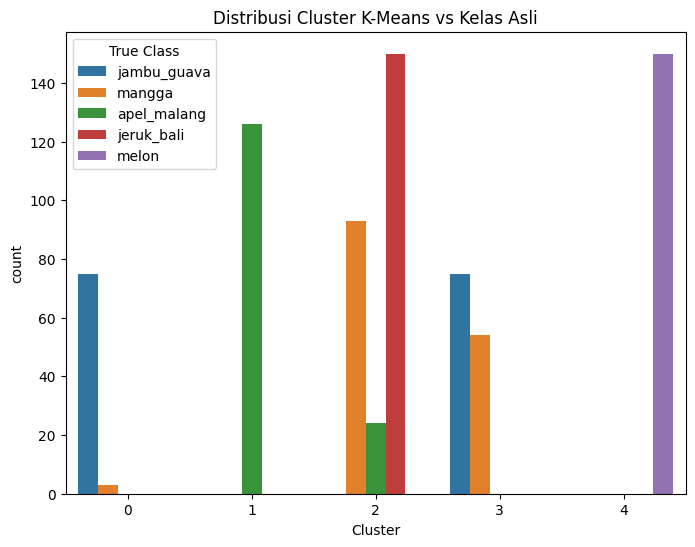


K-NN CLASSIFICATION (Supervised)
K terbaik: 1, Akurasi: 0.9667


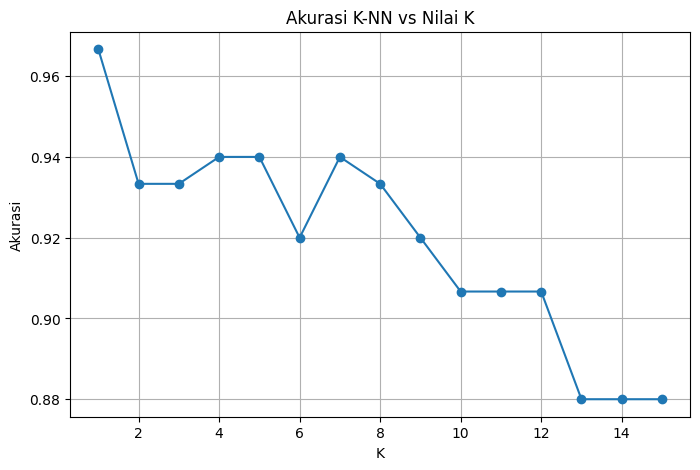


Classification Report (K-NN):
              precision    recall  f1-score   support

 apel_malang       1.00      1.00      1.00        30
 jambu_guava       0.97      0.93      0.95        30
  jeruk_bali       0.94      1.00      0.97        30
      mangga       0.93      0.90      0.92        30
       melon       1.00      1.00      1.00        30

    accuracy                           0.97       150
   macro avg       0.97      0.97      0.97       150
weighted avg       0.97      0.97      0.97       150



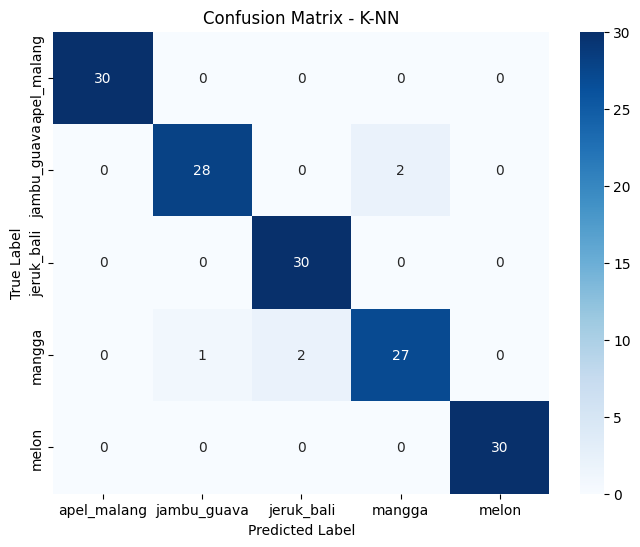


Contoh prediksi 3 gambar dari test set:


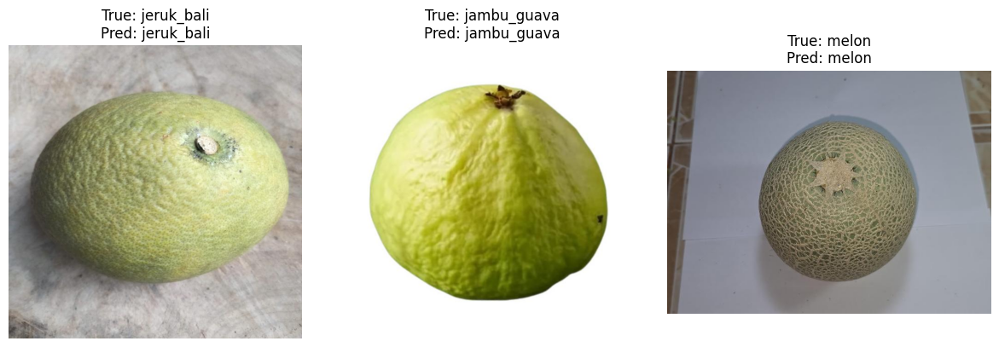


Model K-NN disimpan di: /content/drive/MyDrive/Dataset-PCVK-Kelompok-2/model.pkl

SELESAI! K-NN siap digunakan untuk klasifikasi buah.


In [ ]:
# 4. PATH & KELAS
# base_path = "/content/drive/MyDrive/Dataset PCVK Kelompok 2"
base_path = "/content/drive/MyDrive/Dataset-PCVK-Kelompok-2"
class_names = ['apel_malang', 'jambu_guava', 'jeruk_bali', 'mangga', 'melon']
class_to_id = {name: idx for idx, name in enumerate(class_names)}
id_to_class = {v: k for k, v in class_to_id.items()}

print("Kelas yang digunakan:", class_names)

# 5. FUNGSI EKSTRAKSI FITUR
# ekstraksi warna
def extract_color_histogram(image, bins=(8, 8, 8)):
    """Ekstrak histogram warna RGB"""
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    hist = cv2.calcHist([image], [0, 1, 2], None, bins, [0, 256, 0, 256, 0, 256])
    hist = cv2.normalize(hist, hist).flatten()
    return hist

# ekstraksi bentuk
def extract_hog_features(image):
    """Ekstrak HOG features"""
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image_resized = cv2.resize(image_gray, (128, 128))
    fd, _ = hog(image_resized, orientations=9, pixels_per_cell=(8, 8),
                cells_per_block=(2, 2), visualize=True, block_norm='L2-Hys')
    return fd
# ekstraksi gabungan warna dan bentuk
def extract_features(image_path):
    """Gabungkan histogram + HOG"""
    image = cv2.imread(image_path)
    if image is None:
        return None
    hist = extract_color_histogram(image)
    hog_feat = extract_hog_features(image)
    return np.hstack([hist, hog_feat])

# 6. LOAD DATA & EKSTRAK FITUR
print("\nMengumpulkan dan mengekstrak fitur dari gambar...")

X = []  # Fitur
y = []  # Label
image_paths = []

for class_name in class_names:
    folder = os.path.join(base_path, class_name)
    if not os.path.exists(folder):
        print(f"Folder tidak ditemukan: {folder}")
        continue

    img_paths = glob.glob(os.path.join(folder, "*.jpg")) + \
                glob.glob(os.path.join(folder, "*.jpeg")) + \
                glob.glob(os.path.join(folder, "*.png"))

    print(f"{class_name}: {len(img_paths)} gambar")

    for img_path in img_paths:
        feats = extract_features(img_path)
        if feats is not None:
            X.append(feats)
            y.append(class_to_id[class_name])
            image_paths.append(img_path)

X = np.array(X)
y = np.array(y)

print(f"\nTotal sampel: {len(X)}")
print(f"Dimensi fitur: {X.shape[1]}")

# 7. SPLIT DATA (menguji model)
X_train, X_test, y_train, y_test, path_train, path_test = train_test_split(
    X, y, image_paths, test_size=0.2, stratify=y, random_state=42
)

print(f"Train: {len(X_train)}, Test: {len(X_test)}")

# 8. K-MEANS (UNSUPERVISED CLUSTERING)
print("\n" + "="*50)
print("K-MEANS CLUSTERING (Unsupervised)")
print("="*50)

kmeans = KMeans(n_clusters=len(class_names), random_state=42, n_init=10)
cluster_labels = kmeans.fit_predict(X)

# Mapping cluster ke kelas sebenarnya (majority vote)
cluster_to_class = {}
for cluster_id in range(len(class_names)):
    idx = (cluster_labels == cluster_id)
    if np.sum(idx) > 0:
        true_labels = y[idx]
        most_common = Counter(true_labels).most_common(1)[0][0]
        cluster_to_class[cluster_id] = most_common

# Prediksi berdasarkan cluster
y_pred_kmeans = np.array([cluster_to_class.get(c, -1) for c in cluster_labels])

# Akurasi K-Means
mask = y_pred_kmeans != -1
acc_kmeans = accuracy_score(y[mask], y_pred_kmeans[mask])
print(f"Akurasi K-Means (dengan mapping): {acc_kmeans:.4f}")

# Visualisasi distribusi cluster
plt.figure(figsize=(8, 6))
df_cluster = pd.DataFrame({'Cluster': cluster_labels, 'True Class': [id_to_class[i] for i in y]})
sns.countplot(data=df_cluster, x='Cluster', hue='True Class')
plt.title("Distribusi Cluster K-Means vs Kelas Asli")
plt.show()

# 9. K-NN (SUPERVISED CLASSIFICATION)
print("\n" + "="*50)
print("K-NN CLASSIFICATION (Supervised)")
print("="*50)

# untuk mencari nilai k terbaik
# Cari K terbaik
best_k = 1
best_acc = 0
k_range = range(1, 16)

acc_list = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    acc_list.append(acc)
    if acc > best_acc:
        best_acc = acc
        best_k = k

print(f"K terbaik: {best_k}, Akurasi: {best_acc:.4f}")

# Plot akurasi vs K
plt.figure(figsize=(8, 5))
plt.plot(k_range, acc_list, marker='o')
plt.title('Akurasi K-NN vs Nilai K')
plt.xlabel('K')
plt.ylabel('Akurasi')
plt.grid(True)
plt.show()

# 10. MODEL K-NN FINAL + EVALUASI
knn_final = KNeighborsClassifier(n_neighbors=best_k)
knn_final.fit(X_train, y_train)
y_pred_knn = knn_final.predict(X_test)

print("\nClassification Report (K-NN):")
print(classification_report(y_test, y_pred_knn, target_names=class_names))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_knn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix - K-NN')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# 11. CONTOH PREDIKSI GAMBAR
print("\nContoh prediksi 3 gambar dari test set:")

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for i in range(3):
    idx = np.random.randint(len(X_test))
    img = cv2.imread(path_test[idx])
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    true_label = id_to_class[y_test[idx]]
    pred_label = id_to_class[y_pred_knn[idx]]

    axes[i].imshow(img_rgb)
    axes[i].set_title(f"True: {true_label}\nPred: {pred_label}")
    axes[i].axis('off')
plt.tight_layout()
plt.show()

# 12. SIMPAN MODEL K-NN
import joblib
model_path = os.path.join(base_path, 'model.pkl')
joblib.dump(knn_final, model_path)
print(f"\nModel K-NN disimpan di: {model_path}")

# Cara load nanti:
# knn = joblib.load(model_path)
# pred = knn.predict(new_features)

print("\nSELESAI! K-NN siap digunakan untuk klasifikasi buah.")

In [ ]:

# 12. SIMPAN MODEL K-NN PADA DRIVE
import joblib
import shutil

local_model_path = "/content/drive/MyDrive/Dataset-PCVK-Kelompok-2/model"
joblib.dump(knn_final, local_model_path)
print(f"Model sementara disimpan di: {local_model_path}")

drive_model_path = os.path.join(base_path, 'knn_buah_classifier.pkl')
shutil.copy(local_model_path, drive_model_path)
print(f"Model berhasil disalin ke Google Drive: {drive_model_path}")

if os.path.exists(drive_model_path):
    print("Model tersedia di Drive!")
else:
    print("Gagal menyalin. Cek izin Drive.")

Model sementara disimpan di: /content/drive/MyDrive/Dataset-PCVK-Kelompok-2/model
Model berhasil disalin ke Google Drive: /content/drive/MyDrive/Dataset-PCVK-Kelompok-2/knn_buah_classifier.pkl
Model tersedia di Drive!


In [ ]:
# DETEKSI BUAH

import joblib
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode
from skimage.feature import hog

#  1. LOAD MODEL K-NN
model_path = '/content/drive/MyDrive/Dataset-PCVK-Kelompok-2/knn_buah_classifier.pkl'
knn_model = joblib.load(model_path)
print("Model K-NN berhasil dimuat!")

# 2. LOAD HAAR CASCADE UNTUK DETEKSI WAJAH
!wget -q https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

# 3. DAFTAR KELAS
class_names = ['apel_malang', 'jambu_guava', 'jeruk_bali', 'mangga', 'melon']

# 4. EKSTRAKSI FITUR
def extract_color_histogram(image, bins=(8, 8, 8)):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    hist = cv2.calcHist([image], [0, 1, 2], None, bins, [0, 256, 0, 256, 0, 256])
    hist = cv2.normalize(hist, hist).flatten()
    return hist

#resize
def extract_hog_features(image):
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image_resized = cv2.resize(image_gray, (128, 128))
    fd, _ = hog(image_resized, orientations=9, pixels_per_cell=(8, 8),
                cells_per_block=(2, 2), visualize=True, block_norm='L2-Hys')
    return fd

def extract_features(image):
    hist = extract_color_histogram(image)
    hog_feat = extract_hog_features(image)
    return np.hstack([hist, hog_feat])

# 5. FUNGSI AMBIL FOTO DARI KAMERA
def take_photo(filename='photo.jpg', quality=0.8):
    js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Ambil Foto';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
        f.write(binary)
    return filename

#  6. PREDIKSI + CEK WAJAH
def predict_with_face_check(image_path, min_confidence=60):
    img = cv2.imread(image_path)
    if img is None:
        return None, "Gagal baca gambar", 0

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # DETEKSI WAJAH
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(50, 50))

    if len(faces) > 0:
        for (x, y, w, h) in faces:
            cv2.rectangle(img_rgb, (x, y), (x+w, y+h), (255, 0, 0), 4)
        return img_rgb, "INI WAJAH MANUSIA!\nBUKAN BUAH!", 0

    # LANJUT PREDIKSI BUAH
    features = extract_features(img)
    pred_id = knn_model.predict([features])[0]
    pred_class = class_names[pred_id]
    confidence = np.max(knn_model.predict_proba([features])) * 100

    if confidence < min_confidence:
        return img_rgb, f"TIDAK JELAS\nConfidence: {confidence:.1f}%", confidence

    return img_rgb, pred_class.upper(), confidence

# JALANKAN: AMBIL FOTO → DETEKSI
print("\nKlik 'Ambil Foto' untuk mulai...")
print("Pastikan HANYA ADA BUAH di frame!")

try:
    photo_path = take_photo()
    print(f"\nFoto diambil: {photo_path}")

    result_img, message, confidence = predict_with_face_check(photo_path)

    plt.figure(figsize=(10, 8))
    plt.imshow(result_img)

    if "WAJAH" in message:
        plt.title(message + "\nCoba lagi tanpa wajah!", fontsize=18, color='red', fontweight='bold')
    elif "TIDAK JELAS" in message:
        plt.title(message, fontsize=16, color='orange')
    else:
        plt.title(f"DETEKSI BUAH: {message}\nConfidence: {confidence:.1f}%",
                  fontsize=18, color='green', fontweight='bold')

    plt.axis('off')
    plt.show()

    print(f"\n{message}")
    if confidence > 0:
        print(f"Confidence: {confidence:.1f}%")

except Exception as e:
    print(f"Error: {e}")
    print("Pastikan webcam diizinkan di browser.")

# Progress 2

preprocessing dataset
- resize
- rotate
- pisahkan object dengan background
- Normalisasi
- Pengurangan Noise
- GLCM (untuk texture, dll)
- menampilkan histogram dari ekstraksi warna


Tampilkan hasil visualisasi nya


# Versi 1 progress 2

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os, glob
import seaborn as sns
import pandas as pd
import joblib

from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

from skimage.feature import hog, graycomatrix, graycoprops

In [ ]:
import cv2
import numpy as np
import os
from skimage.feature import hog, graycomatrix, graycoprops
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import pickle
import matplotlib.pyplot as plt


In [ ]:
from google.colab import output
from IPython.display import HTML, Javascript
import cv2
import numpy as np
import base64

In [ ]:
# 4. PATH & KELAS
# base_path = "/content/drive/MyDrive/Dataset-PCVK-Kelompok-2"
base_path = "/content/drive/MyDrive/Dataset-PCVK-Kelompok-2"
class_names = ['apel_malang', 'jambu_guava', 'jeruk_bali', 'mangga', 'melon']
class_to_id = {name: idx for idx, name in enumerate(class_names)}
id_to_class = {v: k for k, v in class_to_id.items()}

print("Kelas yang digunakan:", class_names)

Kelas yang digunakan: ['apel_malang', 'jambu_guava', 'jeruk_bali', 'mangga', 'melon']


# Progress 2

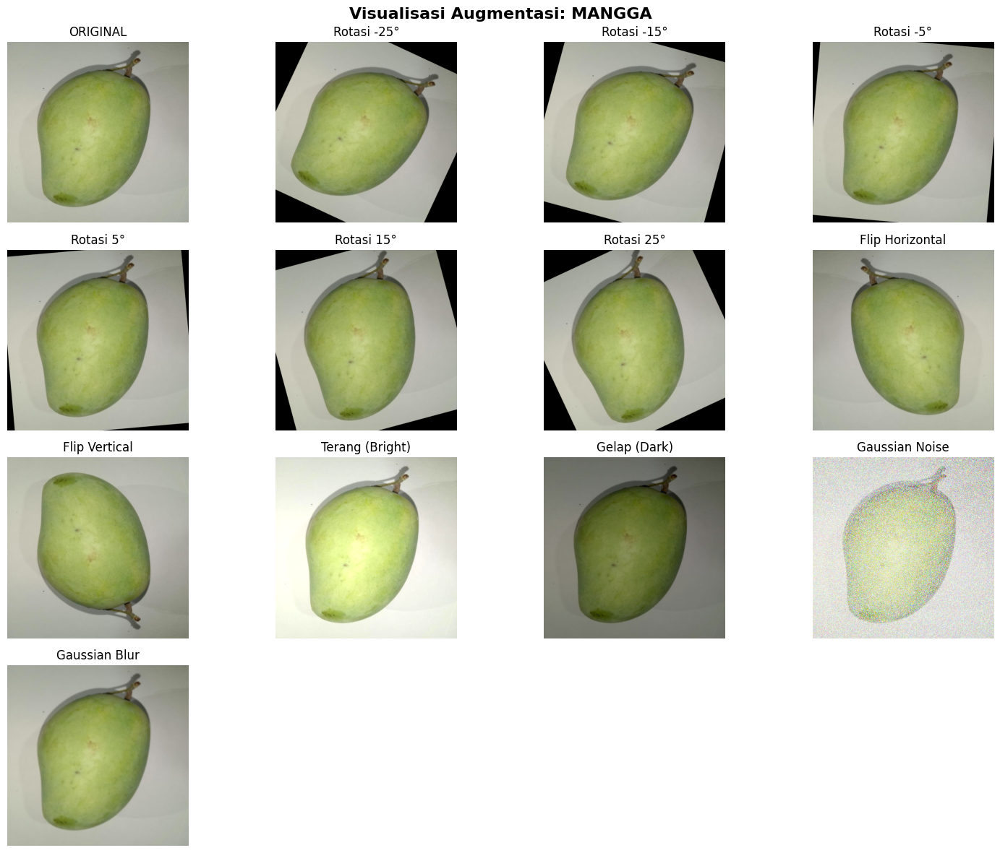

✅ Total variasi gambar per 1 foto asli: 12 variasi.


In [ ]:
# ==========================================
# CEK VISUALISASI AUGMENTASI
# ==========================================
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
import os

# 1. Konfigurasi Path (Sesuaikan jika perlu)
base_path = "/content/drive/MyDrive/Dataset-PCVK-Kelompok-2"
target_class = "mangga"  # Ganti dengan 'apel_malang', 'jambu_guava', dll untuk cek buah lain

# 2. Fungsi Augmentasi (Sama persis dengan kode Training Anda)
def augment_image(img):
    augmented = []
    names = [] # Kita simpan nama tekniknya untuk label plot

    # Rotasi
    for angle in [-25, -15, -5, 5, 15, 25]:
        h, w = img.shape[:2]
        M = cv2.getRotationMatrix2D((w//2, h//2), angle, 1)
        augmented.append(cv2.warpAffine(img, M, (w, h)))
        names.append(f"Rotasi {angle}°")

    # Flip
    augmented.append(cv2.flip(img, 1))
    names.append("Flip Horizontal")

    augmented.append(cv2.flip(img, 0))
    names.append("Flip Vertical")

    # Brightness
    augmented.append(cv2.convertScaleAbs(img, alpha=1.2, beta=25))
    names.append("Terang (Bright)")

    augmented.append(cv2.convertScaleAbs(img, alpha=0.8, beta=-25))
    names.append("Gelap (Dark)")

    # Noise
    noise = np.random.normal(0, 15, img.shape).astype(np.uint8)
    augmented.append(cv2.add(img, noise))
    names.append("Gaussian Noise")

    # Blur
    augmented.append(cv2.GaussianBlur(img, (7, 7), 0))
    names.append("Gaussian Blur")

    return augmented, names

# 3. Ambil 1 Gambar Sampel
folder_path = os.path.join(base_path, target_class)
image_paths = glob.glob(folder_path + "/*.jpg") + glob.glob(folder_path + "/*.png")

if len(image_paths) > 0:
    # Ambil gambar pertama sebagai sampel
    original_img = cv2.imread(image_paths[0])

    # Lakukan Augmentasi
    aug_images, aug_names = augment_image(original_img)

    # Tambahkan gambar asli ke list untuk ditampilkan di awal
    aug_images.insert(0, original_img)
    aug_names.insert(0, "ORIGINAL")

    # 4. Plotting (Matplotlib)
    num_images = len(aug_images)
    cols = 4  # Jumlah kolom per baris
    rows = (num_images // cols) + 1

    plt.figure(figsize=(15, 12))
    plt.suptitle(f"Visualisasi Augmentasi: {target_class.upper()}", fontsize=16, fontweight='bold')

    for i in range(num_images):
        plt.subplot(rows, cols, i + 1)

        # Convert BGR (OpenCV) ke RGB (Matplotlib)
        img_rgb = cv2.cvtColor(aug_images[i], cv2.COLOR_BGR2RGB)

        plt.imshow(img_rgb)
        plt.title(aug_names[i])
        plt.axis("off") # Hilangkan sumbu X/Y agar rapi

    plt.tight_layout()
    plt.show()

    print(f"✅ Total variasi gambar per 1 foto asli: {len(aug_images)-1} variasi.")

else:
    print(f"❌ Tidak ditemukan gambar di folder: {folder_path}")

In [ ]:
# ==============================================
# FILE 1 — AUGMENTASI + TRAINING + SAVE MODEL
# ==============================================
import cv2
import numpy as np
import os
import glob
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
import joblib
import matplotlib.pyplot as plt

# -----------------------------
# 1. KELAS & PATH
# -----------------------------
base_path = "/content/drive/MyDrive/Dataset-PCVK-Kelompok-2"
class_names = ['apel_malang', 'jambu_guava', 'jeruk_bali', 'mangga', 'melon']
class_to_id = {name: idx for idx, name in enumerate(class_names)}

# -----------------------------
# 2. AUGMENTASI
# -----------------------------
def augment_image(img):
    augmented = []

    for angle in [-25, -15, -5, 5, 15, 25]:
        h, w = img.shape[:2]
        M = cv2.getRotationMatrix2D((w//2, h//2), angle, 1)
        augmented.append(cv2.warpAffine(img, M, (w, h)))

    augmented.append(cv2.flip(img, 1))
    augmented.append(cv2.flip(img, 0))

    augmented.append(cv2.convertScaleAbs(img, alpha=1.2, beta=25))
    augmented.append(cv2.convertScaleAbs(img, alpha=0.8, beta=-25))

    noise = np.random.normal(0, 15, img.shape).astype(np.uint8)
    augmented.append(cv2.add(img, noise))

    augmented.append(cv2.GaussianBlur(img, (7, 7), 0))

    return augmented

# -----------------------------
# 3. PREPROCESSING
# -----------------------------
def preprocess(img):
    img = cv2.resize(img, (128, 128))
    return img

# -----------------------------
# 4. EKSTRAK FITUR
# -----------------------------
def extract_features(img):
    img = cv2.resize(img, (128, 128))

    hog = cv2.HOGDescriptor()
    hog_feat = hog.compute(img).flatten()

    hist = cv2.calcHist([img], [0, 1, 2], None, [8, 8, 8],
                        [0, 256, 0, 256, 0, 256]).flatten()

    return np.concatenate([hog_feat, hist])

# -----------------------------
# 5. LOAD + AUGMENT + EXTRACT
# -----------------------------
X, y = [], []

for cname in class_names:
    folder = os.path.join(base_path, cname)
    paths = glob.glob(folder + "/*.jpg") + glob.glob(folder + "/*.png")

    for p in paths:
        img = cv2.imread(p)

        # original
        feat = extract_features(img)
        X.append(feat)
        y.append(class_to_id[cname])

        # augment
        aug_list = augment_image(img)
        for aug in aug_list:
            f = extract_features(aug)
            X.append(f)
            y.append(class_to_id[cname])

X = np.array(X)
y = np.array(y)

print("Dataset final:", X.shape)

# -----------------------------
# 6. NORMALISASI
# -----------------------------
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# -----------------------------
# 7. TRAIN SVM
# -----------------------------
svm = SVC(kernel="rbf", gamma="scale", C=10)
svm.fit(X_scaled, y)

# -----------------------------
# 8. SIMPAN MODEL + SCALER
# -----------------------------
joblib.dump(svm, "/content/svm_model.pkl")
joblib.dump(scaler, "/content/svm_scaler.pkl")
joblib.dump(class_names, "/content/svm_classes.pkl")

print("Model, scaler, dan classes berhasil disimpan!")


Dataset final: (0,)


ValueError: Expected 2D array, got 1D array instead:
array=[].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

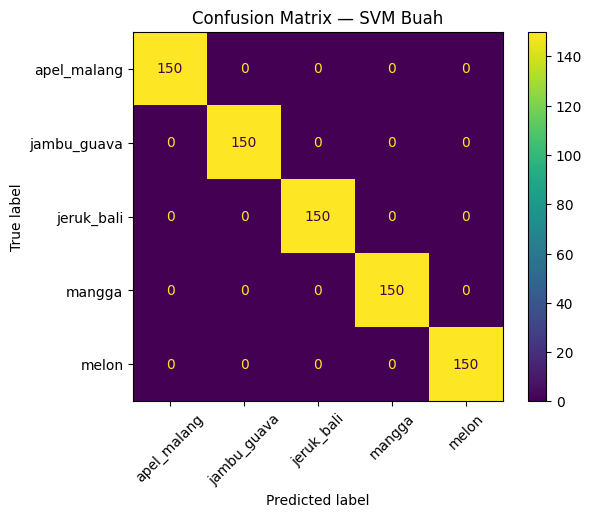

Evaluasi selesai!


In [ ]:
# ==========================================
# FILE 2 — LOAD MODEL & EVALUASI
# ==========================================
import numpy as np
import cv2
import joblib
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

svm = joblib.load("/content/svm_model.pkl")
scaler = joblib.load("/content/svm_scaler.pkl")
class_names = joblib.load("/content/svm_classes.pkl")

def extract_features(img):
    img = cv2.resize(img, (128,128))
    hog = cv2.HOGDescriptor()
    hog_feat = hog.compute(img).flatten()
    hist = cv2.calcHist([img], [0,1,2], None, [8,8,8],
                        [0,256,0,256,0,256]).flatten()
    return np.concatenate([hog_feat, hist])

# -----------------------------
# EVALUASI (Test seluruh dataset)
# -----------------------------
base_path = "/content/drive/MyDrive/Dataset-PCVK-Kelompok-2"

y_true = []
y_pred = []

for cname in class_names:
    paths = glob.glob(f"{base_path}/{cname}/*.jpg")
    for p in paths:
        img = cv2.imread(p)
        feat = extract_features(img)
        feat = scaler.transform([feat])

        pred = svm.predict(feat)[0]
        y_pred.append(pred)
        y_true.append(class_names.index(cname))

# -----------------------------
# CONFUSION MATRIX
# -----------------------------
cm = confusion_matrix(y_true, y_pred)

disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
disp.plot(xticks_rotation=45)
plt.title("Confusion Matrix — SVM Buah")
plt.show()

print("Evaluasi selesai!")


In [ ]:
# ==========================================
# FILE 3 — CAMERA PREDICT (COLAB)
# ==========================================
from google.colab import output
from PIL import Image
import io
import cv2
import numpy as np
import joblib

svm = joblib.load("/content/svm_model.pkl")
scaler = joblib.load("/content/svm_scaler.pkl")
class_names = joblib.load("/content/svm_classes.pkl")

def extract_features(img):
    img = cv2.resize(img, (128,128))
    hog = cv2.HOGDescriptor()
    hog_feat = hog.compute(img).flatten()
    hist = cv2.calcHist([img], [0,1,2], None, [8,8,8],
                        [0,256,0,256,0,256]).flatten()
    return np.concatenate([hog_feat, hist])

# UI Kamera — Jalankan ini
js = """
async function takePhoto() {
  const video = document.createElement('video');
  const stream = await navigator.mediaDevices.getUserMedia({ video: true });

  video.srcObject = stream;
  document.body.appendChild(video);
  await video.play();

  await new Promise(resolve => setTimeout(resolve, 1500));

  const canvas = document.createElement('canvas');
  canvas.width = video.videoWidth;
  canvas.height = video.videoHeight;
  canvas.getContext('2d').drawImage(video, 0, 0);

  stream.getTracks().forEach(t => t.stop());
  video.remove();

  const data = canvas.toDataURL('image/jpeg');
  google.colab.kernel.invokeFunction('notebook.getPhoto', [data], {});
}
"""

# output.enable_custom_marshalling()
output.eval_js(js)

# Handler untuk gambar
def get_photo(data):
    img_bytes = io.BytesIO(base64.b64decode(data.split(',')[1]))
    img = Image.open(img_bytes)
    img_np = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)

    feat = extract_features(img_np)
    feat = scaler.transform([feat])

    pred = svm.predict(feat)[0]
    label = class_names[pred]

    print("Prediksi:", label)

output.register_callback('notebook.getPhoto', get_photo)

print("Ketik: output.eval_js('takePhoto()') untuk mengambil foto")


Ketik: output.eval_js('takePhoto()') untuk mengambil foto


In [ ]:
output.eval_js('takePhoto()')

MessageError: ReferenceError: takePhoto is not defined

In [ ]:
# ==========================================
# FILE 3 — CAMERA PREDICT (COLAB) - FIXED
# ==========================================
from google.colab import output
from PIL import Image
import io
import cv2
import numpy as np
import joblib
import base64  # <--- PENTING: Tambahkan ini agar tidak error saat decode gambar

# Load Model (Pastikan file ini sudah ada di Files Colab)
try:
    svm = joblib.load("/content/svm_model.pkl")
    scaler = joblib.load("/content/svm_scaler.pkl")
    class_names = joblib.load("/content/svm_classes.pkl")
    print("✅ Model berhasil dimuat.")
except FileNotFoundError:
    print("❌ Error: File model (svm_model.pkl, dll) tidak ditemukan di /content/")

# Fungsi Ekstraksi Fitur
def extract_features(img):
    img = cv2.resize(img, (128,128))
    hog = cv2.HOGDescriptor()
    hog_feat = hog.compute(img).flatten()
    hist = cv2.calcHist([img], [0,1,2], None, [8,8,8],
                        [0,256,0,256,0,256]).flatten()
    return np.concatenate([hog_feat, hist])

# Handler untuk memproses gambar dari JS
def get_photo(data):
    try:
        # Decode base64 image
        header, encoded = data.split(",", 1)
        img_bytes = io.BytesIO(base64.b64decode(encoded))
        img = Image.open(img_bytes)
        img_np = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)

        # Prediksi
        feat = extract_features(img_np)
        feat = scaler.transform([feat])
        pred = svm.predict(feat)[0]
        label = class_names[pred]

        # Tampilkan hasil
        print(f"📸 Gambar diterima. Prediksi: {label}")
    except Exception as e:
        print(f"Error saat memproses gambar: {e}")

# Register callback (harus dilakukan sebelum JS dipanggil)
output.register_callback('notebook.getPhoto', get_photo)

# Definisi Javascript UI Kamera
js = """
async function takePhoto() {
  const div = document.createElement('div');
  const video = document.createElement('video');
  const btn = document.createElement('button');

  video.style.display = 'block';
  btn.textContent = 'AMBIL FOTO';
  div.appendChild(video);
  div.appendChild(btn);
  document.body.appendChild(div);

  const stream = await navigator.mediaDevices.getUserMedia({ video: true });
  video.srcObject = stream;
  await video.play();

  // Tunggu tombol diklik
  await new Promise((resolve) => btn.onclick = resolve);

  const canvas = document.createElement('canvas');
  canvas.width = video.videoWidth;
  canvas.height = video.videoHeight;
  canvas.getContext('2d').drawImage(video, 0, 0);

  stream.getTracks().forEach(t => t.stop());
  div.remove();

  const data = canvas.toDataURL('image/jpeg');
  google.colab.kernel.invokeFunction('notebook.getPhoto', [data], {});
}
"""

# Eksekusi Javascript
output.eval_js(js)  # Load fungsi JS ke browser
print("Menyalakan kamera...")
output.eval_js('takePhoto()') # <--- INI YANG MENJALANKAN KAMERA

Proses:


# ver 3


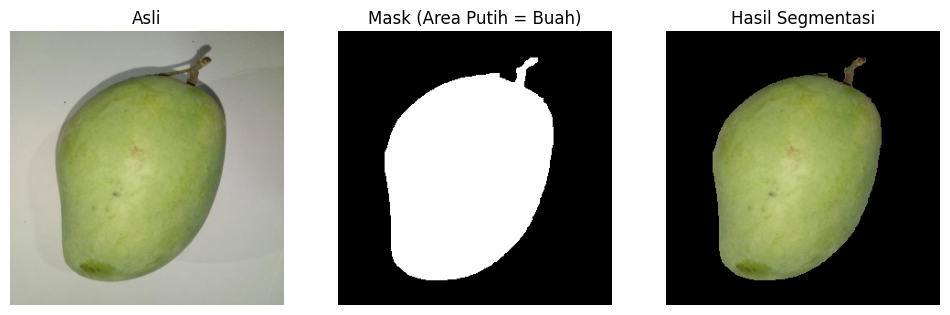

In [ ]:
# ==========================================
# CEK VISUALISASI SEGMENTASI (BACKGROUND REMOVAL)
# ==========================================
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
import os

# Ganti dengan path folder Anda
base_path = "/content/drive/MyDrive/Dataset-PCVK-Kelompok-2"
target_class = "mangga" # Coba ganti: 'jambu_guava', 'apel_malang', dll

def remove_background(img):
    # 1. Konversi ke HSV (Hue, Saturation, Value)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # 2. Ambil channel Saturation
    s_channel = hsv[:,:,1]

    # 3. Blur sedikit untuk menghilangkan noise bintik-bintik
    s_channel = cv2.GaussianBlur(s_channel, (5,5), 0)

    # 4. Otsu Thresholding (Otomatis mencari batas antara objek dan background)
    _, mask = cv2.threshold(s_channel, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # 5. Morphological Operation (Membersihkan lubang-lubang kecil pada mask)
    kernel = np.ones((5,5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)  # Hilangkan noise di background
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel) # Tutup lubang di dalam buah

    # 6. Gabungkan Mask dengan Gambar Asli
    result = cv2.bitwise_and(img, img, mask=mask)

    return result, mask

# Ambil 1 sampel gambar
folder_path = os.path.join(base_path, target_class)
paths = glob.glob(folder_path + "/*.jpg") + glob.glob(folder_path + "/*.png")

if len(paths) > 0:
    original = cv2.imread(paths[0])
    original = cv2.resize(original, (300, 300)) # Resize biar gampang dilihat

    segmented, mask = remove_background(original)

    # Plotting
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title("Asli")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(mask, cmap='gray')
    plt.title("Mask (Area Putih = Buah)")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(segmented, cv2.COLOR_BGR2RGB))
    plt.title("Hasil Segmentasi")
    plt.axis('off')

    plt.show()
else:
    print("Gambar tidak ditemukan.")

In [ ]:
# ==============================================
# FILE 1 — AUGMENTASI + SEGMENTASI + TRAINING
# ==============================================
import cv2
import numpy as np
import os
import glob
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
import joblib

# 1. KELAS & PATH
base_path = "/content/drive/MyDrive/Dataset-PCVK-Kelompok-2"
class_names = ['apel_malang', 'jambu_guava', 'jeruk_bali', 'mangga', 'melon']
class_to_id = {name: idx for idx, name in enumerate(class_names)}

# ---------------------------------------------
# SEGMENTASI
# ---------------------------------------------
def remove_background(img):
    # Convert ke HSV dan ambil Saturation
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    s_channel = hsv[:,:,1]

    # Blur & Threshold
    s_channel = cv2.GaussianBlur(s_channel, (5,5), 0)
    _, mask = cv2.threshold(s_channel, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Rapikan mask
    kernel = np.ones((5,5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

    # Terapkan ke gambar
    result = cv2.bitwise_and(img, img, mask=mask)
    return result

# 2. AUGMENTASI
def augment_image(img):
    augmented = []
    # Rotasi
    for angle in [-20, -10, 10, 20]:
        h, w = img.shape[:2]
        M = cv2.getRotationMatrix2D((w//2, h//2), angle, 1)
        augmented.append(cv2.warpAffine(img, M, (w, h)))

    # Flip
    augmented.append(cv2.flip(img, 1))

    # Brightness (Hanya sedikit biar tidak merusak warna segmentasi)
    augmented.append(cv2.convertScaleAbs(img, alpha=1.1, beta=10))

    return augmented

# 3. EKSTRAK FITUR (DENGAN SEGMENTASI)
def extract_features(img):
    # 1. Resize ke 64x64 (Sesuai keinginan untuk performa cepat)
    img = cv2.resize(img, (64, 64))

    # 2. Segmentasi
    img = remove_background(img)

    # 3. HOG Configuration (DISINI PERBAIKANNYA)
    winSize = (64, 64)
    blockSize = (16, 16)
    blockStride = (8, 8)
    cellSize = (8, 8)
    nbins = 9

    hog = cv2.HOGDescriptor(winSize, blockSize, blockStride, cellSize, nbins)
    hog_feat = hog.compute(img).flatten()

    # 4. Color Histogram
    mask = cv2.inRange(img, (1, 1, 1), (255, 255, 255))
    hist = cv2.calcHist([img], [0, 1, 2], mask, [8, 8, 8],
                        [0, 256, 0, 256, 0, 256]).flatten()

    return np.concatenate([hog_feat, hist])

# 4. LOOPING DATASET
X, y = [], []

print("Mulai proses data (dengan segmentasi)...")
for cname in class_names:
    folder = os.path.join(base_path, cname)
    paths = glob.glob(folder + "/*.jpg") + glob.glob(folder + "/*.png")

    print(f"Processing {cname}...")

    for p in paths:
        img = cv2.imread(p)
        if img is None: continue

        # Data Asli
        X.append(extract_features(img))
        y.append(class_to_id[cname])

        # Data Augmentasi
        aug_list = augment_image(img)
        for aug in aug_list:
            X.append(extract_features(aug))
            y.append(class_to_id[cname])

X = np.array(X)
y = np.array(y)
print("Ukuran Dataset:", X.shape)

# 5. TRAINING
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

svm = SVC(kernel="rbf", C=10, probability=True, verbose=True)
svm.fit(X_scaled, y)

# 6. SIMPAN
joblib.dump(svm, "/content/svm_model.pkl")
joblib.dump(scaler, "/content/svm_scaler.pkl")
joblib.dump(class_names, "/content/svm_classes.pkl")

print("✅ Model dengan Segmentasi Selesai!")

Mulai proses data (dengan segmentasi)...
Processing apel_malang...
Processing jambu_guava...
Processing jeruk_bali...
Processing mangga...
Processing melon...
Ukuran Dataset: (5250, 2276)
[LibSVM]✅ Model dengan Segmentasi Selesai!


⏳ Memuat model...
✅ Model dimuat.
🚀 Memulai evaluasi...


Test melon: 100%|██████████| 150/150 [00:02<00:00, 58.49it/s]



📊 Membuat Visualisasi Confusion Matrix...


<Figure size 1000x800 with 0 Axes>

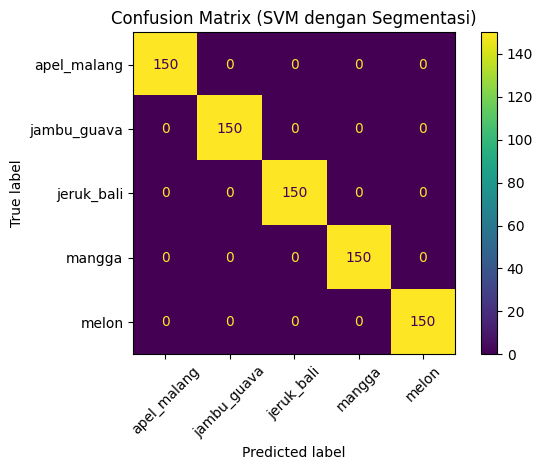


📄 Classification Report:
              precision    recall  f1-score   support

 apel_malang       1.00      1.00      1.00       150
 jambu_guava       1.00      1.00      1.00       150
  jeruk_bali       1.00      1.00      1.00       150
      mangga       1.00      1.00      1.00       150
       melon       1.00      1.00      1.00       150

    accuracy                           1.00       750
   macro avg       1.00      1.00      1.00       750
weighted avg       1.00      1.00      1.00       750



In [ ]:
# ==========================================
# FILE 2 — EVALUASI (CONFUSION MATRIX)
# ==========================================
import numpy as np
import cv2
import joblib
import glob
import os
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from tqdm import tqdm

# 1. LOAD MODEL
print("⏳ Memuat model...")
try:
    svm = joblib.load("/content/svm_model.pkl")
    scaler = joblib.load("/content/svm_scaler.pkl")
    class_names = joblib.load("/content/svm_classes.pkl")
    print("✅ Model dimuat.")
except Exception as e:
    print(f" Gagal memuat model: {e}")
    exit()

# 2. FUNGSI PREPROCESSING (HARUS SAMA PERSIS DENGAN FILE 1)
def remove_background(img):
    # Convert ke HSV
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    s_channel = hsv[:,:,1]

    # Blur & Threshold
    s_channel = cv2.GaussianBlur(s_channel, (5,5), 0)
    _, mask = cv2.threshold(s_channel, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Rapikan mask
    kernel = np.ones((5,5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

    # Terapkan mask
    result = cv2.bitwise_and(img, img, mask=mask)
    return result

def extract_features(img):
    # 1. Resize ke 64x64 (Sesuai keinginan untuk performa cepat)
    img = cv2.resize(img, (64, 64))

    # 2. Segmentasi
    img = remove_background(img)

    # 3. HOG Configuration (DISINI PERBAIKANNYA)
    # Kita set WinSize agar sama persis dengan ukuran gambar (64, 64)
    winSize = (64, 64)
    blockSize = (16, 16)
    blockStride = (8, 8)
    cellSize = (8, 8)
    nbins = 9

    hog = cv2.HOGDescriptor(winSize, blockSize, blockStride, cellSize, nbins)
    hog_feat = hog.compute(img).flatten()

    # 4. Color Histogram
    mask = cv2.inRange(img, (1, 1, 1), (255, 255, 255))
    hist = cv2.calcHist([img], [0, 1, 2], mask, [8, 8, 8],
                        [0, 256, 0, 256, 0, 256]).flatten()

    return np.concatenate([hog_feat, hist])

# 3. EVALUASI SELURUH DATASET
base_path = "/content/drive/MyDrive/Dataset-PCVK-Kelompok-2"

y_true = []
y_pred = []

print("🚀 Memulai evaluasi...")

for cname in class_names:
    folder = os.path.join(base_path, cname)
    paths = glob.glob(folder + "/*.jpg") + glob.glob(folder + "/*.png")

    # Pakai tqdm biar terlihat loading bar-nya
    for p in tqdm(paths, desc=f"Test {cname}"):
        img = cv2.imread(p)
        if img is None: continue

        # Ekstrak fitur
        feat = extract_features(img)
        feat = scaler.transform([feat]) # Jangan lupa di-scale

        # Prediksi
        pred_idx = svm.predict(feat)[0]

        # Simpan hasil
        y_pred.append(class_names[pred_idx]) # Prediksi model
        y_true.append(cname)                 # Kunci jawaban asli

# 4. TAMPILKAN MATRIKS
print("\n📊 Membuat Visualisasi Confusion Matrix...")
cm = confusion_matrix(y_true, y_pred, labels=class_names)

plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap='viridis', xticks_rotation=45, values_format='d')

plt.title("Confusion Matrix (SVM dengan Segmentasi)")
plt.tight_layout()
plt.show()

# 5. LAPORAN TEKS (Akurasi Angka)
print("\n📄 Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

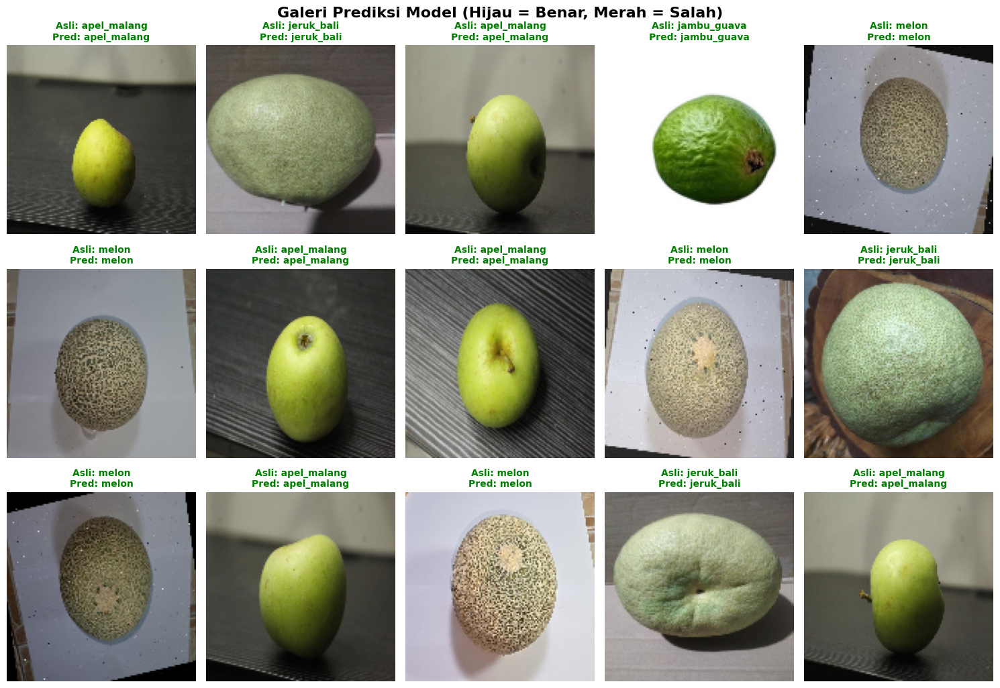

In [ ]:
# ==========================================
# VISUALISASI HASIL PREDIKSI
# ==========================================
import matplotlib.pyplot as plt
import random


def visualize_predictions(num_samples=15):
    # 1. Kumpulkan semua path gambar
    all_paths = []
    all_labels = []

    for cname in class_names:
        folder = os.path.join(base_path, cname)
        paths = glob.glob(folder + "/*.jpg") + glob.glob(folder + "/*.png")
        all_paths.extend(paths)
        all_labels.extend([cname] * len(paths))

    # 2. Ambil sampel acak
    combined = list(zip(all_paths, all_labels))
    random.shuffle(combined)
    samples = combined[:num_samples]

    # 3. Setup Plot
    cols = 5
    rows = (num_samples // cols) + 1
    plt.figure(figsize=(15, 3.5 * rows))
    plt.suptitle("Galeri Prediksi Model (Hijau = Benar, Merah = Salah)", fontsize=16, fontweight='bold')

    for i, (path, true_label) in enumerate(samples):
        # Baca & Preprocess
        img = cv2.imread(path)
        if img is None: continue

        # Simpan gambar asli untuk ditampilkan
        img_display = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_display = cv2.resize(img_display, (128, 128))

        # Ekstrak Fitur (Sesuai Pipeline Training 64x64)
        feat = extract_features(img)
        feat = scaler.transform([feat]) # Scaling

        # Prediksi
        pred_idx = svm.predict(feat)[0]
        pred_label = class_names[pred_idx]

        # Cek Benar/Salah
        is_correct = (pred_label == true_label)
        color = 'green' if is_correct else 'red'

        # Tampilkan
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img_display)

        # Judul Plot (True vs Pred)
        title_text = f"Asli: {true_label}\nPred: {pred_label}"
        plt.title(title_text, color=color, fontweight='bold', fontsize=10)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Jalankan Visualisasi
visualize_predictions(15)

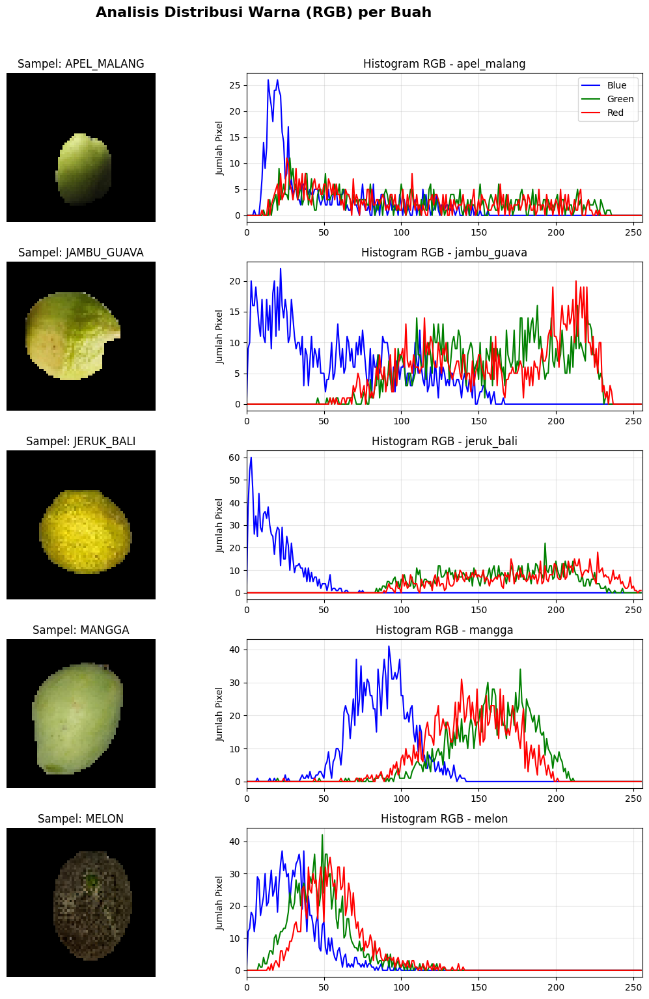

In [ ]:
# ==========================================
# VISUALISASI HISTOGRAM WARNA
# ==========================================
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os
import glob

def show_rgb_histograms():
    # Setup plot: Jumlah baris = jumlah kelas, Kolom = 2 (Gambar & Grafik)
    n_classes = len(class_names)
    fig, axes = plt.subplots(nrows=n_classes, ncols=2, figsize=(12, 3 * n_classes))
    fig.suptitle("Analisis Distribusi Warna (RGB) per Buah", fontsize=16, fontweight='bold', y=1.02)

    colors = ('b', 'g', 'r') # Blue, Green, Red
    labels = ('Blue', 'Green', 'Red')

    for i, cname in enumerate(class_names):
        # 1. Ambil 1 gambar sampel per kelas
        folder = os.path.join(base_path, cname)
        paths = glob.glob(folder + "/*.jpg") + glob.glob(folder + "/*.png")

        if not paths: continue

        # Baca & Preprocess (Sesuai Pipeline 64x64)
        img = cv2.imread(paths[0])
        img = cv2.resize(img, (64, 64))

        # Segmentasi (Hapus Background)
        img_seg = remove_background(img)

        # 2. Tampilkan Gambar (Kolom Kiri)
        ax_img = axes[i, 0]
        ax_img.imshow(cv2.cvtColor(img_seg, cv2.COLOR_BGR2RGB))
        ax_img.set_title(f"Sampel: {cname.upper()}")
        ax_img.axis('off')

        # 3. Hitung & Tampilkan Histogram (Kolom Kanan)
        ax_hist = axes[i, 1]

        # Buat Mask: menghitung histogram HANYA di area buah
        # Area hitam (0,0,0) akan diabaikan
        mask = cv2.inRange(img_seg, (1, 1, 1), (255, 255, 255))

        for j, color in enumerate(colors):
            # calcHist(image, channel, mask, histSize, range)
            hist = cv2.calcHist([img_seg], [j], mask, [256], [0, 256])
            ax_hist.plot(hist, color=color, label=labels[j])

        ax_hist.set_title(f"Histogram RGB - {cname}")
        ax_hist.set_xlim([0, 256]) # Rentang pixel 0 (Gelap) - 255 (Terang)
        ax_hist.set_ylabel("Jumlah Pixel")
        ax_hist.grid(True, alpha=0.3)
        if i == 0: ax_hist.legend() # Tampilkan legenda hanya di baris pertama biar rapi

    plt.tight_layout()
    plt.show()

# Jalankan Visualisasi
show_rgb_histograms()

In [ ]:
# ==========================================
# FILE 3 — UPLOAD FOTO PREDICT (COLAB)
# ==========================================
from google.colab import files
from PIL import Image
import io
import cv2
import numpy as np
import joblib

# Load Model
try:
    svm = joblib.load("/content/svm_model.pkl")
    scaler = joblib.load("/content/svm_scaler.pkl")
    class_names = joblib.load("/content/svm_classes.pkl")
    print("✅ Model berhasil dimuat.")
except FileNotFoundError:
    print("❌ Error: File model tidak ditemukan di /content/")


✅ Model berhasil dimuat.


In [ ]:
def remove_background(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    s_channel = hsv[:,:,1]
    s_channel = cv2.GaussianBlur(s_channel, (5,5), 0)
    _, mask = cv2.threshold(s_channel, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    kernel = np.ones((5,5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    return cv2.bitwise_and(img, img, mask=mask)


In [ ]:
def extract_features(img):
    img = cv2.resize(img, (64, 64))
    img = remove_background(img)

    winSize = (64, 64)
    blockSize = (16, 16)
    blockStride = (8, 8)
    cellSize = (8, 8)
    nbins = 9

    hog = cv2.HOGDescriptor(winSize, blockSize, blockStride, cellSize, nbins)
    hog_feat = hog.compute(img).flatten()

    mask = cv2.inRange(img, (1, 1, 1), (255, 255, 255))
    hist = cv2.calcHist(
        [img], [0, 1, 2], mask,
        [8, 8, 8], [0, 256, 0, 256, 0, 256]
    ).flatten()

    return np.concatenate([hog_feat, hist])


In [ ]:
def predict_uploaded_image():
    uploaded = files.upload()  # memilih file
    for fn in uploaded.keys():
        print(f"📁 File diterima: {fn}")

        # Baca dan konversi
        img = Image.open(io.BytesIO(uploaded[fn]))
        img_np = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)

        # Ekstraksi fitur
        feat = extract_features(img_np)
        feat = scaler.transform([feat])

        # Prediksi
        pred = svm.predict(feat)[0]
        label = class_names[pred]

        print(f"🎉 Prediksi: {label}")


In [ ]:
predict_uploaded_image()


Saving mangga.webp to mangga (2).webp
📁 File diterima: mangga (2).webp
🎉 Prediksi: jeruk_bali


In [ ]:
# ==========================================
# FILE 3 — CAMERA PREDICT (COLAB) - FIXED
# ==========================================
from google.colab import output
from PIL import Image
import io
import cv2
import numpy as np
import joblib
import base64  # <--- PENTING: Tambahkan ini agar tidak error saat decode gambar

# Load Model (Pastikan file ini sudah ada di Files Colab)
try:
    svm = joblib.load("/content/svm_model.pkl")
    scaler = joblib.load("/content/svm_scaler.pkl")
    class_names = joblib.load("/content/svm_classes.pkl")
    print("✅ Model berhasil dimuat.")
except FileNotFoundError:
    print("❌ Error: File model (svm_model.pkl, dll) tidak ditemukan di /content/")

# Tambahkan fungsi ini di File 3 sebelum fungsi get_photo

def remove_background(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    s_channel = hsv[:,:,1]
    s_channel = cv2.GaussianBlur(s_channel, (5,5), 0)
    _, mask = cv2.threshold(s_channel, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((5,5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    result = cv2.bitwise_and(img, img, mask=mask)
    return result

# Update fungsi extract_features di File 3 juga
def extract_features(img):
    # 1. Resize ke 64x64 (Sesuai keinginan untuk performa cepat)
    img = cv2.resize(img, (64, 64))

    # 2. Segmentasi
    img = remove_background(img)

    # 3. HOG Configuration (DISINI PERBAIKANNYA)
    # Kita set WinSize agar sama persis dengan ukuran gambar (64, 64)
    winSize = (64, 64)
    blockSize = (16, 16)
    blockStride = (8, 8)
    cellSize = (8, 8)
    nbins = 9

    hog = cv2.HOGDescriptor(winSize, blockSize, blockStride, cellSize, nbins)
    hog_feat = hog.compute(img).flatten()

    # 4. Color Histogram
    mask = cv2.inRange(img, (1, 1, 1), (255, 255, 255))
    hist = cv2.calcHist([img], [0, 1, 2], mask, [8, 8, 8],
                        [0, 256, 0, 256, 0, 256]).flatten()

    return np.concatenate([hog_feat, hist])

# Handler untuk memproses gambar dari JS
def get_photo(data):
    try:
        # Decode base64 image
        header, encoded = data.split(",", 1)
        img_bytes = io.BytesIO(base64.b64decode(encoded))
        img = Image.open(img_bytes)
        img_np = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)

        # Prediksi
        feat = extract_features(img_np)
        feat = scaler.transform([feat])
        pred = svm.predict(feat)[0]
        label = class_names[pred]

        # Tampilkan hasil
        print(f"📸 Gambar diterima. Prediksi: {label}")
    except Exception as e:
        print(f"Error saat memproses gambar: {e}")

# Register callback (harus dilakukan sebelum JS dipanggil)
output.register_callback('notebook.getPhoto', get_photo)

# Definisi Javascript UI Kamera
js = """
async function takePhoto() {
  const div = document.createElement('div');
  const video = document.createElement('video');
  const btn = document.createElement('button');

  video.style.display = 'block';
  btn.textContent = 'AMBIL FOTO';
  div.appendChild(video);
  div.appendChild(btn);
  document.body.appendChild(div);

  const stream = await navigator.mediaDevices.getUserMedia({ video: true });
  video.srcObject = stream;
  await video.play();

  // Tunggu tombol diklik
  await new Promise((resolve) => btn.onclick = resolve);

  const canvas = document.createElement('canvas');
  canvas.width = video.videoWidth;
  canvas.height = video.videoHeight;
  canvas.getContext('2d').drawImage(video, 0, 0);

  stream.getTracks().forEach(t => t.stop());
  div.remove();

  const data = canvas.toDataURL('image/jpeg');
  google.colab.kernel.invokeFunction('notebook.getPhoto', [data], {});
}
"""

# Eksekusi Javascript
output.eval_js(js)  # Load fungsi JS ke browser
print("Menyalakan kamera...")
output.eval_js('takePhoto()') # <--- INI YANG MENJALANKAN KAMERA

✅ Model berhasil dimuat.
Menyalakan kamera...
📸 Gambar diterima. Prediksi: jeruk_bali


In [ ]:
# ==========================================
# FILE 3 — CAMERA PREDICT (DENGAN DETEKSI WAJAH & CONFIDENCE)
# ==========================================
from google.colab import output
from PIL import Image
import io
import cv2
import numpy as np
import joblib
import base64
import matplotlib.pyplot as plt

# 1. LOAD MODEL & UTILS
try:
    svm = joblib.load("/content/svm_model.pkl")
    scaler = joblib.load("/content/svm_scaler.pkl")
    class_names = joblib.load("/content/svm_classes.pkl")

    # Load Detektor Wajah (Haar Cascade bawaan OpenCV)
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

    print("✅ Model Buah & Detektor Wajah berhasil dimuat.")
except FileNotFoundError:
    print("❌ Error: File model tidak ditemukan. Jalankan File 1 & 2 dulu.")

# 2. FUNGSI PREPROCESSING
def remove_background(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    s_channel = hsv[:,:,1]
    s_channel = cv2.GaussianBlur(s_channel, (5,5), 0)
    _, mask = cv2.threshold(s_channel, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((5,5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    result = cv2.bitwise_and(img, img, mask=mask)
    return result

def extract_features(img):
    # Resize 64x64 (Sesuai Training)
    img = cv2.resize(img, (64, 64))

    # Segmentasi
    img = remove_background(img)

    # HOG (64x64 Configuration)
    winSize = (64, 64)
    blockSize = (16, 16)
    blockStride = (8, 8)
    cellSize = (8, 8)
    nbins = 9
    hog = cv2.HOGDescriptor(winSize, blockSize, blockStride, cellSize, nbins)
    hog_feat = hog.compute(img).flatten()

    # Histogram Warna
    mask = cv2.inRange(img, (1, 1, 1), (255, 255, 255))
    hist = cv2.calcHist([img], [0, 1, 2], mask, [8, 8, 8],
                        [0, 256, 0, 256, 0, 256]).flatten()

    return np.concatenate([hog_feat, hist])

# 3. HANDLER GAMBAR (LOGIKA UTAMA)
def get_photo(data):
    try:
        # Decode Gambar
        header, encoded = data.split(",", 1)
        img_bytes = io.BytesIO(base64.b64decode(encoded))
        img = Image.open(img_bytes)
        img_np = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)

        # --- CEK 1: APAKAH ADA WAJAH? ---
        gray = cv2.cvtColor(img_np, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

        plt.figure(figsize=(5, 5))
        plt.imshow(cv2.cvtColor(img_np, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        if len(faces) > 0:
            # Jika Wajah Terdeteksi
            for (x, y, w, h) in faces:
                # Gambar kotak di sekitar wajah untuk visualisasi
                cv2.rectangle(img_np, (x, y), (x+w, y+h), (0, 0, 255), 2)

            # Update tampilan dengan kotak merah
            plt.imshow(cv2.cvtColor(img_np, cv2.COLOR_BGR2RGB))
            plt.title("⚠️ TERDETEKSI GAMBAR WAJAH\n(Sistem mendeteksi manusia, bukan buah)", color='red', fontsize=12, fontweight='bold')
            plt.show()
            print("🚫 Prediksi dibatalkan karena terdeteksi wajah.")
            return

        # --- CEK 2: JIKA TIDAK ADA WAJAH, LANJUT PREDIKSI BUAH ---
        feat = extract_features(img_np)
        feat = scaler.transform([feat])

        # Ambil probabilitas (Confident Score)
        probs = svm.predict_proba(feat)[0]
        pred_idx = np.argmax(probs)
        label = class_names[pred_idx]
        conf = probs[pred_idx] * 100

        # Tampilkan Hasil
        title_text = f"Prediksi: {label.upper()}\nAkurasi/Confident: {conf:.1f}%"
        color = 'green' if conf > 70 else 'orange'

        plt.title(title_text, color=color, fontsize=12, fontweight='bold')
        plt.show()

        print(f"✅ Hasil: {label} ({conf:.2f}%)")

    except Exception as e:
        print(f"Error: {e}")

output.register_callback('notebook.getPhoto', get_photo)

# 4. JAVASCRIPT UI
js = """
async function takePhoto() {
  const div = document.createElement('div');
  const video = document.createElement('video');
  const btn = document.createElement('button');

  video.style.display = 'block';
  btn.textContent = 'AMBIL FOTO';
  btn.style.backgroundColor = 'blue';
  btn.style.color = 'white';
  btn.style.padding = '10px';
  btn.style.fontSize = '16px';
  btn.style.marginTop = '10px';

  div.appendChild(video);
  div.appendChild(btn);
  document.body.appendChild(div);

  const stream = await navigator.mediaDevices.getUserMedia({ video: true });
  video.srcObject = stream;
  await video.play();

  // Tunggu tombol diklik
  await new Promise((resolve) => btn.onclick = resolve);

  const canvas = document.createElement('canvas');
  canvas.width = video.videoWidth;
  canvas.height = video.videoHeight;
  canvas.getContext('2d').drawImage(video, 0, 0);

  stream.getTracks().forEach(t => t.stop());
  div.remove();

  const data = canvas.toDataURL('image/jpeg');
  google.colab.kernel.invokeFunction('notebook.getPhoto', [data], {});
}
"""

output.eval_js(js)
print("📸 Kamera siap. Silakan klik 'AMBIL FOTO'...")
output.eval_js('takePhoto()')

❌ Error: File model tidak ditemukan. Jalankan File 1 & 2 dulu.
📸 Kamera siap. Silakan klik 'AMBIL FOTO'...
Error: name 'face_cascade' is not defined


# Progress 3

In [ ]:
!pip install PyWavelets scipy

import cv2
import numpy as np
import os
import glob
import pywt # Library untuk Discrete Wavelet Transform (DWT)
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis
from skimage.feature import graycomatrix, graycoprops
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import joblib

# Ganti dengan path dataset Anda
base_path = "/content/drive/MyDrive/Dataset-PCVK-Kelompok-2"
class_names = ['apel_malang', 'jambu_guava', 'jeruk_bali', 'mangga', 'melon']
class_to_id = {name: idx for idx, name in enumerate(class_names)}

Menampilkan visualisasi preprocessing untuk satu gambar...


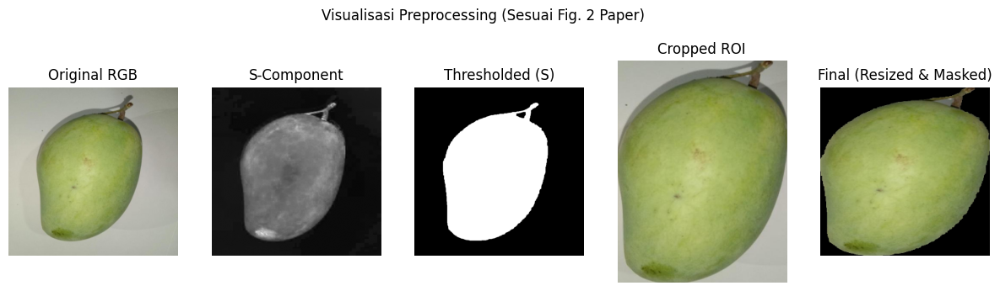

In [ ]:
def preprocess_image(image, visualize=False):
    """
    Mengimplementasikan Bagian III-A: Preprocessing & Background Subtraction.
    Menggunakan channel 'S' dari HSV untuk thresholding.
    """
    # 1. Convert RGB to HSV [cite: 92]
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)

    # 2. Thresholding pada komponen 'S' [cite: 93]
    # Menggunakan Otsu's thresholding otomatis
    _, binary_mask = cv2.threshold(s, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # 3. Morphological Operations (Close small holes) [cite: 93]
    kernel = np.ones((5, 5), np.uint8)
    binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel, iterations=1)

    # 4. Find ROI & Crop [cite: 94]
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    roi_img = image # Default jika gagal crop

    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h_rect = cv2.boundingRect(largest_contour)

        # Crop gambar asli sesuai kotak bounding box
        roi_img = image[y:y+h_rect, x:x+w]

        # 5. Background Subtraction Visual (Opsional, untuk visualisasi seperti Fig 2)
        # Membuat background jadi hitam di luar kontur
        mask_final = np.zeros_like(s)
        cv2.drawContours(mask_final, [largest_contour], -1, 255, -1)
        # Crop mask juga
        mask_cropped = mask_final[y:y+h_rect, x:x+w]
        # Terapkan mask ke ROI
        roi_with_black_bg = cv2.bitwise_and(roi_img, roi_img, mask=mask_cropped)
    else:
        roi_with_black_bg = roi_img

    # Resize ke ukuran standar (penting untuk Wavelet nanti)
    roi_resized = cv2.resize(roi_with_black_bg, (256, 256))

    # --- VISUALISASI SEPERTI FIG. 2 & FIG. 4 PADA PAPER ---
    if visualize:
        plt.figure(figsize=(15, 4))

        plt.subplot(1, 5, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title("Original RGB")
        plt.axis('off')

        plt.subplot(1, 5, 2)
        plt.imshow(s, cmap='gray')
        plt.title("S-Component")
        plt.axis('off')

        plt.subplot(1, 5, 3)
        plt.imshow(binary_mask, cmap='gray')
        plt.title("Thresholded (S)")
        plt.axis('off')

        plt.subplot(1, 5, 4)
        plt.imshow(cv2.cvtColor(roi_img, cv2.COLOR_BGR2RGB))
        plt.title("Cropped ROI")
        plt.axis('off')

        plt.subplot(1, 5, 5)
        plt.imshow(cv2.cvtColor(roi_resized, cv2.COLOR_BGR2RGB))
        plt.title("Final (Resized & Masked)")
        plt.axis('off')

        plt.suptitle("Visualisasi Preprocessing (Sesuai Fig. 2 Paper)")
        plt.show()

    return roi_resized

# TEST VISUALISASI PREPROCESSING
# Ambil satu gambar acak untuk dites
test_files = glob.glob(os.path.join(base_path, "*", "*.jpg"))
if test_files:
    print("Menampilkan visualisasi preprocessing untuk satu gambar...")
    img_test = cv2.imread(test_files[0])
    preprocess_image(img_test, visualize=True)

Menampilkan visualisasi DWT untuk satu gambar...


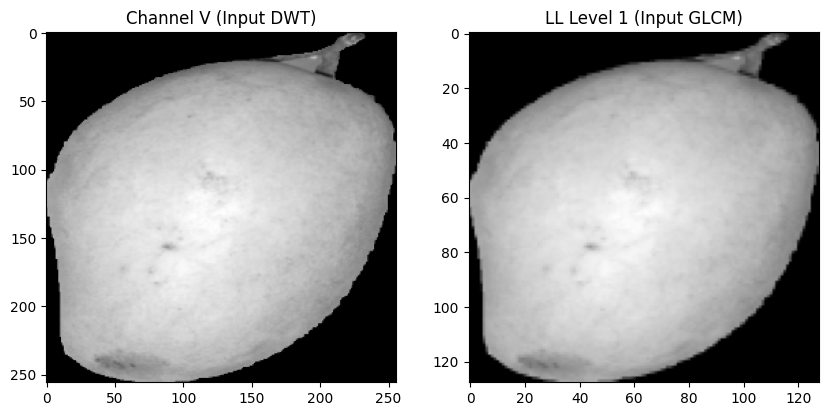

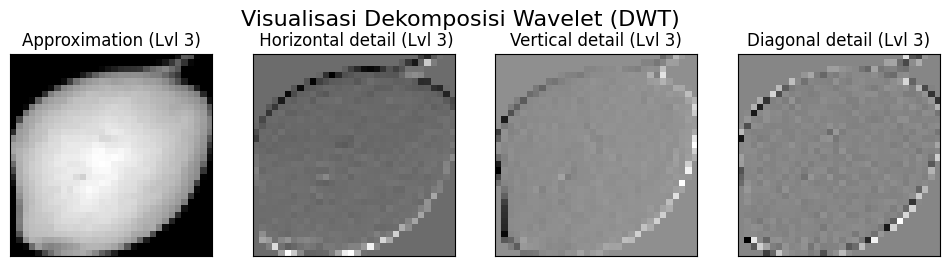

In [ ]:
# Fungsi Bantuan: Menghitung Cluster Shade & Prominence (Manual)
# Karena skimage tidak memiliki fitur ini, kita hitung manual sesuai rumus Eq (8) & (9) [cite: 121]
def calculate_cluster_features(glcm):
    shades = []
    prominences = []
    for i in range(glcm.shape[2]): # Angle
        for j in range(glcm.shape[3]): # Distance
            matrix = glcm[:, :, i, j]
            N = matrix.shape[0]
            r, c = np.meshgrid(np.arange(N), np.arange(N), indexing='ij')

            mean_i = np.sum(r * matrix)
            mean_j = np.sum(c * matrix)
            term = (r + c - mean_i - mean_j)

            shade = np.sum((term ** 3) * matrix)
            prominence = np.sum((term ** 4) * matrix)
            shades.append(shade)
            prominences.append(prominence)
    return np.mean(shades), np.mean(prominences)

def extract_features_paper(image, visualize=False):
    # 1. Convert to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)

    # --- A. FITUR WARNA (Bagian III-B) ---
    # Mean, Std, Skewness, Kurtosis dari H dan S
    color_features = []
    for channel in [h, s]:
        mu = np.mean(channel)
        sigma = np.std(channel)
        sk = skew(channel.flatten())
        kur = kurtosis(channel.flatten())
        color_features.extend([mu, sigma, sk, kur]) # 4 fitur * 2 channel = 8 fitur

    # --- B. FITUR TEKSTUR (Bagian III-C) ---
    # Menggunakan DWT pada channel 'V'
    coeffs = pywt.wavedec2(v, 'haar', level=3) # 3 Level Decomposition [cite: 110]
    LL1 = pywt.wavedec2(v, 'haar', level=1)[0] # Ambil LL dari level 1 untuk GLCM

    # 1. GLCM Features dari Approximation Level 1
    # Normalisasi LL1 ke 0-255 integer
    LL1_norm = cv2.normalize(LL1, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    glcm = graycomatrix(LL1_norm, distances=[1], angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                        levels=256, symmetric=True, normed=True)

    contrast = graycoprops(glcm, 'contrast').mean()
    energy = graycoprops(glcm, 'energy').mean()
    homogeneity = graycoprops(glcm, 'homogeneity').mean()
    shade, prominence = calculate_cluster_features(glcm) # Custom function

    glcm_features = [contrast, energy, homogeneity, shade, prominence] # 5 Fitur

    # 2. Std Deviation dari Detail Components (3 Level) [cite: 113, 181]
    # coeffs[0] = LL3, coeffs[1] = (LH3, HL3, HH3), dst...
    wavelet_features = []

    # Std Dev dari Approximation Level 3 (LL3) [cite: 113]
    wavelet_features.append(np.std(coeffs[0]))

    # Std Dev dari Detail Components (Level 3, 2, 1) [cite: 113]
    for level_detail in coeffs[1:]:
        (LH, HL, HH) = level_detail
        wavelet_features.extend([np.std(LH), np.std(HL), np.std(HH)])

    # Gabungkan semua
    final_vector = np.hstack([color_features, glcm_features, wavelet_features])

    # --- VISUALISASI WAVELET (DWT) ---
    if visualize:
        plt.figure(figsize=(10, 10))
        plt.subplot(2,2,1); plt.imshow(v, cmap='gray'); plt.title("Channel V (Input DWT)")
        plt.subplot(2,2,2); plt.imshow(LL1_norm, cmap='gray'); plt.title("LL Level 1 (Input GLCM)")

        # Visualisasi Level 3 details
        titles = ['Approximation', ' Horizontal detail',
                  'Vertical detail', 'Diagonal detail']
        cA = coeffs[0]
        (cH, cV, cD) = coeffs[1] # Level 3 details
        fig = plt.figure(figsize=(12, 3))
        for i, a in enumerate([cA, cH, cV, cD]):
            ax = fig.add_subplot(1, 4, i + 1)
            ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
            ax.title.set_text(titles[i] + " (Lvl 3)")
            ax.set_xticks([])
            ax.set_yticks([])
        fig.suptitle("Visualisasi Dekomposisi Wavelet (DWT)", fontsize=16)
        plt.show()

    return final_vector

# TEST VISUALISASI FITUR
if test_files:
    print("Menampilkan visualisasi DWT untuk satu gambar...")
    # Preprocess dulu, baru ekstrak fitur
    processed_img = preprocess_image(cv2.imread(test_files[0]))
    _ = extract_features_paper(processed_img, visualize=True)

In [ ]:
# =========================================================
# FASE 4: TRAINING DENGAN AUGMENTASI (ROTATE + BLUR)
# =========================================================

import albumentations as A
# 1. SETUP AUGMENTASI
def setup_augmentations():
    """
    Pipeline Augmentasi:
    - Rotate: Agar mengenali buah dari berbagai sudut.
    - Blur: Agar mengenali buah meski kamera tidak fokus sempurna.
    """
    return A.Compose([
        # Rotasi acak hingga 45 derajat (lebih berani dari sebelumnya)
        A.Rotate(limit=45, p=1.0, border_mode=cv2.BORDER_CONSTANT, value=0),

        # Blur halus (mensimulasikan kamera webcam biasa)
        A.GaussianBlur(blur_limit=(3, 5), p=0.5),

        # Tambahan: Flip Horizontal (Cermin) - Sangat aman untuk buah
        A.HorizontalFlip(p=0.5),

        # Tambahan: Sedikit perubahan kecerahan (opsional, biar makin tangguh)
        A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.5)
    ])

# 2. PROSES EKSTRAKSI FITUR DENGAN AUGMENTASI
print("\nMulai Ekstraksi Fitur dengan Augmentasi...")

X = []
y = []
augmentor = setup_augmentations()
N_AUGMENTATIONS = 3 # Setiap gambar akan dibuatkan 3 variasi tambahan

for class_name in class_names:
    folder = os.path.join(base_path, class_name)
    if not os.path.exists(folder): continue

    img_paths = glob.glob(os.path.join(folder, "*"))
    print(f"  Memproses kelas {class_name} ({len(img_paths)} gambar asli)...")

    for path in img_paths:
        img = cv2.imread(path)
        if img is None: continue

        # --- A. DATA ASLI ---
        # 1. Preprocessing (ROI)
        roi = preprocess_image(img, visualize=False)
        # 2. Ekstraksi Fitur (Metode Paper)
        feats = extract_features_paper(roi, visualize=False)
        # 3. Handle NaN
        if np.any(np.isnan(feats)): feats = np.nan_to_num(feats)

        X.append(feats)
        y.append(class_to_id[class_name])

        # --- B. DATA AUGMENTASI (MULTIPLY DATASET) ---
        for _ in range(N_AUGMENTATIONS):
            # Buat gambar variasi (Rotate/Blur)
            augmented = augmentor(image=img)['image']

            # Proses gambar variasi sama seperti gambar asli
            roi_aug = preprocess_image(augmented, visualize=False)
            feats_aug = extract_features_paper(roi_aug, visualize=False)

            if np.any(np.isnan(feats_aug)): feats_aug = np.nan_to_num(feats_aug)

            X.append(feats_aug)
            y.append(class_to_id[class_name])

X = np.array(X)
y = np.array(y)

print(f"\nTotal Data Latih (Asli + Augmentasi): {len(X)}")
print(f"Dimensi Fitur: {X.shape[1]}")

# =========================================================
# LANJUT KE TRAINING SVM (NORMALISASI & GRID SEARCH)
# =========================================================
from sklearn.preprocessing import StandardScaler

# 1. Normalisasi (WAJIB)
print("Melakukan Normalisasi Data...")
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 2. Split Data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42, stratify=y)

# 3. Training SVM
print("\nMelatih SVM Classifier...")
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale', 'auto'],
    'kernel': ['rbf', 'linear']
}

# n_jobs=1 agar aman dari macet
grid = GridSearchCV(SVC(), param_grid, cv=5, verbose=1, n_jobs=1)
grid.fit(X_train, y_train)

print(f"\nParameter Terbaik: {grid.best_params_}")
best_svm = grid.best_estimator_

# 4. Evaluasi
y_pred = best_svm.predict(X_test)
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=class_names))

# 5. Simpan Model & Scaler
joblib.dump(best_svm, os.path.join(base_path, 'model_svm_paper_final.pkl'))
joblib.dump(scaler, os.path.join(base_path, 'scaler.pkl'))
print("Model dan Scaler berhasil disimpan.")


Mulai Ekstraksi Fitur dengan Augmentasi...
  Memproses kelas apel_malang (150 gambar asli)...


/tmp/ipython-input-4008499764.py:16: UserWarning: Argument(s) 'value' are not valid for transform Rotate
  A.Rotate(limit=45, p=1.0, border_mode=cv2.BORDER_CONSTANT, value=0),


  Memproses kelas jambu_guava (150 gambar asli)...
  Memproses kelas jeruk_bali (150 gambar asli)...
  Memproses kelas mangga (150 gambar asli)...
  Memproses kelas melon (150 gambar asli)...

Total Data Latih (Asli + Augmentasi): 3000
Dimensi Fitur: 23
Melakukan Normalisasi Data...

Melatih SVM Classifier...
Fitting 5 folds for each of 16 candidates, totalling 80 fits

Parameter Terbaik: {'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}

Classification Report:
              precision    recall  f1-score   support

 apel_malang       1.00      1.00      1.00       120
 jambu_guava       1.00      0.98      0.99       120
  jeruk_bali       0.99      1.00      1.00       120
      mangga       0.98      1.00      0.99       120
       melon       1.00      0.99      1.00       120

    accuracy                           0.99       600
   macro avg       1.00      0.99      0.99       600
weighted avg       1.00      0.99      0.99       600

Model dan Scaler berhasil disimpan.


Memvisualisasikan 6 prediksi acak...



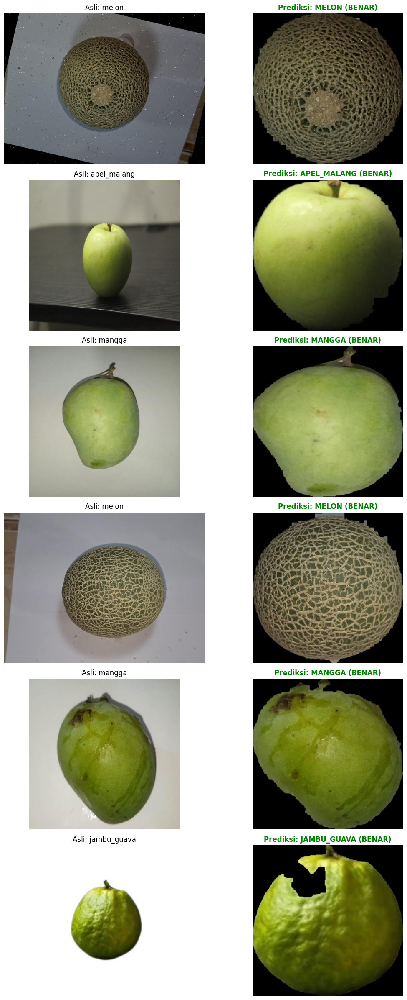

In [ ]:
import random

def visualize_model_predictions(model, scaler, base_path, num_samples=5):
    # Ambil semua path gambar
    all_images = glob.glob(os.path.join(base_path, "*", "*.jpg")) + \
                 glob.glob(os.path.join(base_path, "*", "*.png"))

    if not all_images:
        print("Tidak ada gambar ditemukan.")
        return

    # Pilih sampel acak
    samples = random.sample(all_images, num_samples)

    plt.figure(figsize=(12, 4 * num_samples))

    print(f"Memvisualisasikan {num_samples} prediksi acak...\n")

    for i, img_path in enumerate(samples):
        # 1. Ambil Label Asli dari nama folder
        true_label = os.path.basename(os.path.dirname(img_path))

        # 2. Baca Gambar
        img = cv2.imread(img_path)
        if img is None: continue

        # 3. PIPELINE LENGKAP (Sama persis seperti saat training)
        # A. Preprocessing (Ambil ROI)
        roi = preprocess_image(img, visualize=False)

        # B. Ekstraksi Fitur (Metode Paper: Stats + Wavelet)
        raw_features = extract_features_paper(roi, visualize=False)

        # C. Handle NaN/Inf
        if np.any(np.isnan(raw_features)):
            raw_features = np.nan_to_num(raw_features)

        # D. SCALING (PENTING SEKALI!)
        # Reshape ke (1, -1) karena cuma 1 sampel
        scaled_features = scaler.transform(raw_features.reshape(1, -1))

        # E. Prediksi
        pred_id = model.predict(scaled_features)[0]
        pred_label = class_names[pred_id]

        # 4. VISUALISASI
        # Tentukan warna teks (Hijau kalau benar, Merah kalau salah)
        text_color = 'green' if pred_label == true_label else 'red'
        status = "BENAR" if pred_label == true_label else "SALAH"

        # Plot Gambar Asli
        plt.subplot(num_samples, 2, 2*i + 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Asli: {true_label}", fontsize=12)
        plt.axis('off')

        # Plot ROI (Apa yang dilihat mesin)
        plt.subplot(num_samples, 2, 2*i + 2)
        plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))
        plt.title(f"Prediksi: {pred_label.upper()} ({status})", fontsize=12, color=text_color, fontweight='bold')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# JALANKAN VISUALISASI
# Pastikan 'svm_model' dan 'scaler' sudah ada di memori (dari sel training sebelumnya)
visualize_model_predictions(svm_model, scaler, base_path, num_samples=6)

Memuat Model dan Scaler...
✅ Sukses memuat Model & Scaler!

📸 Siap Deteksi! Silakan klik 'Ambil Foto'.


<IPython.core.display.Javascript object>

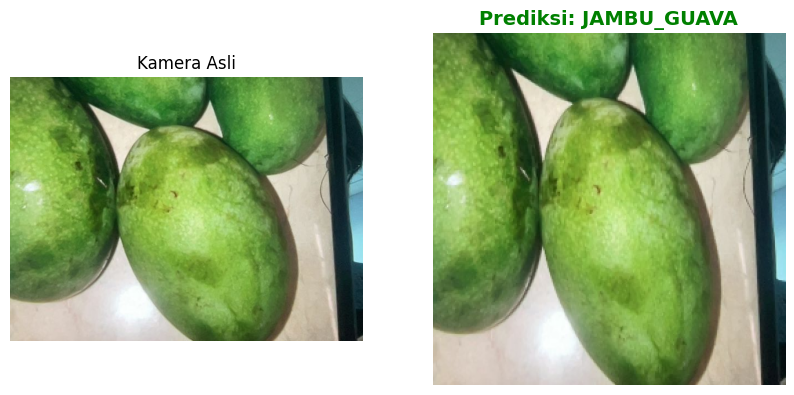

✅ Hasil Deteksi: JAMBU_GUAVA


In [ ]:
# =========================================================
# DETEKSI BUAH REAL-TIME (METODE PAPER + SCALER)
# =========================================================

import cv2
import numpy as np
import joblib
import pywt
import os
from scipy.stats import skew, kurtosis
from skimage.feature import graycomatrix, graycoprops
import matplotlib.pyplot as plt
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

# 1. KONFIGURASI
base_path = "/content/drive/MyDrive/Dataset-PCVK-Kelompok-2"
class_names = ['apel_malang', 'jambu_guava', 'jeruk_bali', 'mangga', 'melon']

# 2. LOAD MODEL & SCALER (WAJIB ADA KEDUANYA)
print("Memuat Model dan Scaler...")
try:
    # Load Model SVM terbaru
    svm_model = joblib.load(os.path.join(base_path, 'model_svm_paper_final.pkl'))

    # Load Scaler (Untuk menormalkan data kamera agar sama dengan data latih)
    scaler = joblib.load(os.path.join(base_path, 'scaler.pkl'))
    print("✅ Sukses memuat Model & Scaler!")
except Exception as e:
    print(f"❌ ERROR: {e}")
    print("Pastikan file 'model_svm_paper_final.pkl' dan 'scaler.pkl' ada di Google Drive!")

# 3. FUNGSI PREPROCESSING & EKSTRAKSI (COPY DARI TRAINING)

# [cite_start]A. Preprocessing (ROI S-Channel) [cite: 60, 91-94]
def preprocess_image(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    _, s, _ = cv2.split(hsv)

    # Thresholding S-Channel
    _, binary = cv2.threshold(s, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Bersihkan noise
    kernel = np.ones((5, 5), np.uint8)
    binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel, iterations=2)
    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=1)

    # Crop ROI
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h_rect = cv2.boundingRect(largest_contour)
        roi = image[y:y+h_rect, x:x+w]
        return cv2.resize(roi, (256, 256))
    return cv2.resize(image, (256, 256))

# [cite_start]B. Fitur Tambahan (Cluster Shade/Prominence) [cite: 121]
def calculate_cluster_features(glcm):
    shades = []
    prominences = []
    for i in range(glcm.shape[2]):
        for j in range(glcm.shape[3]):
            matrix = glcm[:, :, i, j]
            N = matrix.shape[0]
            r, c = np.meshgrid(np.arange(N), np.arange(N), indexing='ij')
            mean_i = np.sum(r * matrix); mean_j = np.sum(c * matrix)
            term = (r + c - mean_i - mean_j)
            shades.append(np.sum((term ** 3) * matrix))
            prominences.append(np.sum((term ** 4) * matrix))
    return np.mean(shades), np.mean(prominences)

# [cite_start]C. Ekstraksi Fitur Utama (Paper Method) [cite: 96-113]
def extract_features_paper(image):
    # 1. Warna (Stats H & S)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    color_feats = []
    for channel in [h, s]:
        color_feats.extend([np.mean(channel), np.std(channel), skew(channel.flatten()), kurtosis(channel.flatten())])

    # 2. Tekstur (Wavelet DWT)
    coeffs = pywt.wavedec2(v, 'haar', level=3)

    # GLCM pada LL Level 1
    LL1 = pywt.wavedec2(v, 'haar', level=1)[0]
    LL1_norm = cv2.normalize(LL1, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    glcm = graycomatrix(LL1_norm, distances=[1], angles=[0, np.pi/4, np.pi/2, 3*np.pi/4], levels=256, symmetric=True, normed=True)

    contrast = graycoprops(glcm, 'contrast').mean()
    energy = graycoprops(glcm, 'energy').mean()
    homogeneity = graycoprops(glcm, 'homogeneity').mean()
    shade, prominence = calculate_cluster_features(glcm)

    # Std Dev Wavelet Details
    wavelet_feats = [np.std(coeffs[0])] # Std LL3
    for level_coeffs in coeffs[1:]:
        wavelet_feats.extend([np.std(c) for c in level_coeffs])

    return np.hstack([color_feats, [contrast, energy, homogeneity, shade, prominence], wavelet_feats])

# 4. FUNGSI AMBIL FOTO (JAVASCRIPT)
def take_photo(filename='photo.jpg', quality=0.8):
    js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Ambil Foto';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
        f.write(binary)
    return filename

# 5. LOOP DETEKSI UTAMA
print("\n📸 Siap Deteksi! Silakan klik 'Ambil Foto'.")

try:
    photo_path = take_photo()
    img = cv2.imread(photo_path)

    if img is not None:
        # 1. Preprocessing
        roi = preprocess_image(img)

        # 2. Ekstraksi Fitur Mentah
        raw_feats = extract_features_paper(roi)
        # Handle NaN/Inf
        if np.any(np.isnan(raw_feats)): raw_feats = np.nan_to_num(raw_feats)

        # 3. NORMALISASI (SCALING) - WAJIB!!
        # Data kamera harus diskalakan pakai rumus yang sama dengan data training
        feats_scaled = scaler.transform(raw_feats.reshape(1, -1))

        # 4. Prediksi
        pred_idx = svm_model.predict(feats_scaled)[0]
        pred_label = class_names[pred_idx]

        # 5. Tampilkan Hasil
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1); plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); plt.title("Kamera Asli"); plt.axis('off')
        plt.subplot(1, 2, 2); plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB)); plt.title(f"Prediksi: {pred_label.upper()}", color='green', fontweight='bold', fontsize=14); plt.axis('off')
        plt.show()

        print(f"✅ Hasil Deteksi: {pred_label.upper()}")
    else:
        print("Gagal membaca gambar.")

except Exception as e:
    print(f"Error: {e}")


📸 Silakan ambil foto buah untuk dianalisis...


<IPython.core.display.Javascript object>

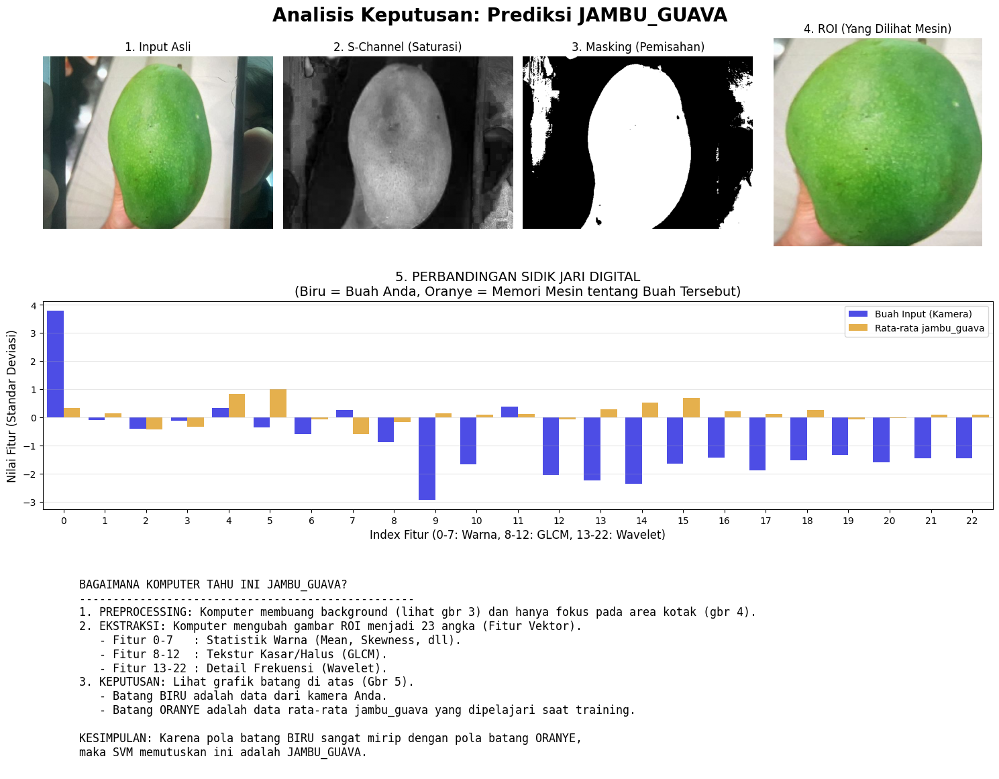

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# =========================================================
# FUNGSI VISUALISASI "OTA KOMPUTER"
# =========================================================

def visualize_decision_process(model, scaler, X_train_scaled, y_train, class_names):
    print("\n📸 Silakan ambil foto buah untuk dianalisis...")
    photo_path = take_photo()
    img = cv2.imread(photo_path)

    if img is None: return

    # --- TAHAP 1: APA YANG DILIHAT (PREPROCESSING) ---
    # Komputer tidak peduli meja/tembok, dia hanya cari warna dominan (S-channel)
    roi = preprocess_image(img)

    # Ambil visualisasi intermediate untuk ditampilkan
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    _, s, _ = cv2.split(hsv)
    _, binary = cv2.threshold(s, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # --- TAHAP 2: APA YANG DIHITUNG (EKSTRAKSI FITUR) ---
    # Ekstrak fitur mentah
    raw_feats = extract_features_paper(roi)
    if np.any(np.isnan(raw_feats)): raw_feats = np.nan_to_num(raw_feats)

    # Normalisasi (Scaling) agar bisa dibandingkan
    input_vector = scaler.transform(raw_feats.reshape(1, -1))[0]

    # --- TAHAP 3: APA YANG DIBANDINGKAN (DECISION) ---
    # Prediksi kelas
    pred_idx = model.predict([input_vector])[0]
    pred_class = class_names[pred_idx]

    # HITUNG "SIDIK JARI" RATA-RATA UNTUK KELAS PREDIKSI
    # Kita ambil rata-rata fitur dari semua data training kelas tersebut
    # Ini adalah "Memori" komputer tentang seperti apa seharusnya buah itu
    indices = np.where(y_train == pred_idx)[0]
    class_avg_vector = np.mean(X_train_scaled[indices], axis=0)

    # --- PLOTTING (VISUALISASI) ---
    plt.figure(figsize=(15, 12))
    plt.suptitle(f"Analisis Keputusan: Prediksi {pred_class.upper()}", fontsize=20, fontweight='bold', y=0.98)

    # A. VISUALISASI MATANYA (ROI)
    plt.subplot(3, 4, 1); plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); plt.title("1. Input Asli"); plt.axis('off')
    plt.subplot(3, 4, 2); plt.imshow(s, cmap='gray'); plt.title("2. S-Channel (Saturasi)"); plt.axis('off')
    plt.subplot(3, 4, 3); plt.imshow(binary, cmap='gray'); plt.title("3. Masking (Pemisahan)"); plt.axis('off')
    plt.subplot(3, 4, 4); plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB)); plt.title("4. ROI (Yang Dilihat Mesin)"); plt.axis('off')

    # B. VISUALISASI LOGIKANYA (PERBANDINGAN VEKTOR)
    # Kita bandingkan 23 Nilai Input vs 23 Nilai Rata-rata Kelas
    # Jika garisnya berimpit/mirip, berarti cocok!

    ax = plt.subplot(3, 1, 2)

    # Buat DataFrame untuk plot
    feature_indices = np.arange(len(input_vector))
    df_compare = pd.DataFrame({
        'Index Fitur': np.tile(feature_indices, 2),
        'Nilai (Scaled)': np.concatenate([input_vector, class_avg_vector]),
        'Tipe': ['Buah Input (Kamera)'] * len(input_vector) + [f'Rata-rata {pred_class}'] * len(class_avg_vector)
    })

    sns.barplot(data=df_compare, x='Index Fitur', y='Nilai (Scaled)', hue='Tipe', palette=['blue', 'orange'], alpha=0.8)

    plt.title("5. PERBANDINGAN SIDIK JARI DIGITAL\n(Biru = Buah Anda, Oranye = Memori Mesin tentang Buah Tersebut)", fontsize=14)
    plt.xlabel("Index Fitur (0-7: Warna, 8-12: GLCM, 13-22: Wavelet)", fontsize=12)
    plt.ylabel("Nilai Fitur (Standar Deviasi)", fontsize=12)
    plt.grid(True, axis='y', alpha=0.3)
    plt.legend(loc='upper right')

    # C. PENJELASAN TEKS
    plt.subplot(3, 1, 3)
    plt.axis('off')
    text_info = f"""
    BAGAIMANA KOMPUTER TAHU INI {pred_class.upper()}?
    --------------------------------------------------
    1. PREPROCESSING: Komputer membuang background (lihat gbr 3) dan hanya fokus pada area kotak (gbr 4).
    2. EKSTRAKSI: Komputer mengubah gambar ROI menjadi 23 angka (Fitur Vektor).
       - Fitur 0-7   : Statistik Warna (Mean, Skewness, dll).
       - Fitur 8-12  : Tekstur Kasar/Halus (GLCM).
       - Fitur 13-22 : Detail Frekuensi (Wavelet).
    3. KEPUTUSAN: Lihat grafik batang di atas (Gbr 5).
       - Batang BIRU adalah data dari kamera Anda.
       - Batang ORANYE adalah data rata-rata {pred_class} yang dipelajari saat training.

    KESIMPULAN: Karena pola batang BIRU sangat mirip dengan pola batang ORANYE,
    maka SVM memutuskan ini adalah {pred_class.upper()}.
    """
    plt.text(0.01, 0.5, text_info, fontsize=12, fontfamily='monospace', va='center')

    plt.tight_layout()
    plt.show()

# --- JALANKAN ---
# Pastikan X_scaled, y, scaler, svm_model sudah ada dari proses training sebelumnya
try:
    visualize_decision_process(svm_model, scaler, X_scaled, y, class_names)
except NameError:
    print("Variabel training (X_scaled, y, dll) tidak ditemukan. Harap jalankan training dulu.")

# Progress 3 versi 1

In [ ]:
# ==================================================================================
# FULL TRAINING PIPELINE: HYBRID (PAPER + HOG) + SMART RESIZE (PADDING)
# ==================================================================================

import cv2
import numpy as np
import os
import glob
import pywt
import joblib
import albumentations as A
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis
from skimage.feature import graycomatrix, graycoprops, hog
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# 1. KONFIGURASI
base_path = "/content/drive/MyDrive/Dataset-PCVK-Kelompok-2"
class_names = ['apel_malang', 'jambu_guava', 'jeruk_bali', 'mangga', 'melon']
class_to_id = {name: idx for idx, name in enumerate(class_names)}

# --- FUNGSI BARU: RESIZE TANPA MERUSAK BENTUK ---
def resize_with_padding(image, target_size=(256, 256)):
    """
    Resize gambar sambil mempertahankan Aspect Ratio dengan menambahkan padding hitam.
    Agar Mangga tetap lonjong dan Guava tetap bulat.
    """
    h, w = image.shape[:2]
    target_w, target_h = target_size

    # Hitung skala agar muat di kotak target
    scale = min(target_w/w, target_h/h)
    new_w = int(w * scale)
    new_h = int(h * scale)

    # Resize gambar asli
    resized = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)

    # Buat kanvas hitam
    canvas = np.zeros((target_h, target_w, 3), dtype=np.uint8)

    # Hitung posisi tengah
    x_offset = (target_w - new_w) // 2
    y_offset = (target_h - new_h) // 2

    # Tempel gambar di tengah
    canvas[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = resized

    return canvas

# 2. FUNGSI PREPROCESSING & AUGMENTASI

def setup_augmentations():
    return A.Compose([
        A.Rotate(limit=45, p=1.0, border_mode=cv2.BORDER_CONSTANT, value=0),
        A.GaussianBlur(blur_limit=(3, 5), p=0.5),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.5)
    ])

def preprocess_image(image):
    """
    VERSI KETAT: Hanya ambil warna Hijau/Kuning.
    Tangan, Lantai, dan Rak akan dibuang (jadi hitam).
    """
    # 1. Convert ke HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # 2. Definisikan Range Warna Buah (Hijau kekuningan sampai Hijau tua)
    # Hue 20-90 mencakup Jeruk Bali, Mangga, Melon, Guava, Apel Malang
    lower_fruit = np.array([20, 40, 40])
    upper_fruit = np.array([90, 255, 255])

    # 3. Buat Masking Warna
    mask = cv2.inRange(hsv, lower_fruit, upper_fruit)

    # 4. Bersihkan noise (bintik-bintik kecil)
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)

    # 5. Cari Kontur Terbesar (Buah)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        largest_contour = max(contours, key=cv2.contourArea)

        # Filter: Jika kontur terlalu kecil (misal cuma bintik sampah), abaikan
        if cv2.contourArea(largest_contour) > 500:
            x, y, w, h_rect = cv2.boundingRect(largest_contour)

            # Crop ROI dari gambar asli
            roi = image[y:y+h_rect, x:x+w]

            # Terapkan mask ke ROI agar background di dalam kotak jadi hitam pekat
            # (Ini langkah krusial untuk membuang tangan yang mungkin ikut ter-crop)
            mask_roi = mask[y:y+h_rect, x:x+w]
            roi_masked = cv2.bitwise_and(roi, roi, mask=mask_roi)

            return resize_with_padding(roi_masked, (256, 256))

    # Jika gagal deteksi warna hijau, kembalikan gambar kosong/hitam atau resize biasa
    return resize_with_padding(image, (256, 256))

# 3. FUNGSI EKSTRAKSI FITUR (PAPER + HOG)

def get_color_stats(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, _ = cv2.split(hsv)
    features = []
    for channel in [h, s]:
        features.extend([np.mean(channel), np.std(channel), skew(channel.flatten()), kurtosis(channel.flatten())])
    return np.array(features)

def get_texture_features(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    _, _, v = cv2.split(hsv)
    coeffs = pywt.wavedec2(v, 'haar', level=3)
    LL1 = pywt.wavedec2(v, 'haar', level=1)[0]
    LL1_norm = cv2.normalize(LL1, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    glcm = graycomatrix(LL1_norm, distances=[1, 2], angles=[0, np.pi/4, np.pi/2], levels=256, symmetric=True, normed=True)

    contrast = graycoprops(glcm, 'contrast').mean()
    energy = graycoprops(glcm, 'energy').mean()
    homogeneity = graycoprops(glcm, 'homogeneity').mean()

    shades, prominences = [], []
    for i in range(glcm.shape[2]):
        for j in range(glcm.shape[3]):
            matrix = glcm[:, :, i, j]
            N = matrix.shape[0]
            r, c = np.meshgrid(np.arange(N), np.arange(N), indexing='ij')
            mean_i, mean_j = np.sum(r * matrix), np.sum(c * matrix)
            term = (r + c - mean_i - mean_j)
            shades.append(np.sum((term ** 3) * matrix))
            prominences.append(np.sum((term ** 4) * matrix))

    wavelet_std = [np.std(coeffs[0])]
    for level in coeffs[1:]:
        wavelet_std.extend([np.std(c) for c in level])
    return np.array([contrast, energy, homogeneity, np.mean(shades), np.mean(prominences)] + wavelet_std)

def get_hog_features(image):
    # Resize lebih kecil untuk HOG
    img_resized = cv2.resize(image, (128, 128))
    gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    fd = hog(gray, orientations=9, pixels_per_cell=(16, 16),
             cells_per_block=(2, 2), visualize=False, block_norm='L2-Hys')
    return fd

def extract_features_hybrid(image):
    roi = preprocess_image(image)
    # Fitur Paper + HOG
    return np.hstack([
        get_color_stats(roi),
        get_texture_features(roi),
        get_hog_features(roi)
    ])

# 4. EXECUTE PIPELINE
print("\nMulai Ekstraksi Fitur (Smart Resize)...")

X = []
y = []
augmentor = setup_augmentations()
N_AUGMENTATIONS = 3

for class_name in class_names:
    folder = os.path.join(base_path, class_name)
    if not os.path.exists(folder): continue

    img_paths = glob.glob(os.path.join(folder, "*"))
    print(f"  Memproses {class_name}...")

    for path in img_paths:
        img = cv2.imread(path)
        if img is None: continue

        # Asli
        feats = extract_features_hybrid(img)
        if np.any(np.isnan(feats)): feats = np.nan_to_num(feats)
        X.append(feats)
        y.append(class_to_id[class_name])

        # Augmentasi
        for _ in range(N_AUGMENTATIONS):
            aug_img = augmentor(image=img)['image']
            feats_aug = extract_features_hybrid(aug_img)
            if np.any(np.isnan(feats_aug)): feats_aug = np.nan_to_num(feats_aug)
            X.append(feats_aug)
            y.append(class_to_id[class_name])

X = np.array(X)
y = np.array(y)

# 5. TRAINING
print("Normalisasi Data...")
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42, stratify=y)

print("\nMelatih SVM (Ini mungkin agak lama)...")
param_grid = {'C': [1, 10, 100], 'gamma': ['scale', 'auto'], 'kernel': ['rbf', 'linear']}
grid = GridSearchCV(SVC(), param_grid, cv=3, verbose=1, n_jobs=1)
grid.fit(X_train, y_train)

best_svm = grid.best_estimator_
print(f"Akurasi Test: {grid.best_score_:.4f}")

# Simpan
joblib.dump(best_svm, os.path.join(base_path, 'model_svm_smart.pkl'))
joblib.dump(scaler, os.path.join(base_path, 'scaler_smart.pkl'))
print("Model Tersimpan!")


Mulai Ekstraksi Fitur (Smart Resize)...
  Memproses apel_malang...


/tmp/ipython-input-2473656759.py:60: UserWarning: Argument(s) 'value' are not valid for transform Rotate
  A.Rotate(limit=45, p=1.0, border_mode=cv2.BORDER_CONSTANT, value=0),


  Memproses jambu_guava...
  Memproses jeruk_bali...
  Memproses mangga...
  Memproses melon...
Normalisasi Data...

Melatih SVM (Ini mungkin agak lama)...
Fitting 3 folds for each of 12 candidates, totalling 36 fits
Akurasi Test: 0.9479
Model Tersimpan!


1. EVALUASI MODEL (CONFUSION MATRIX)


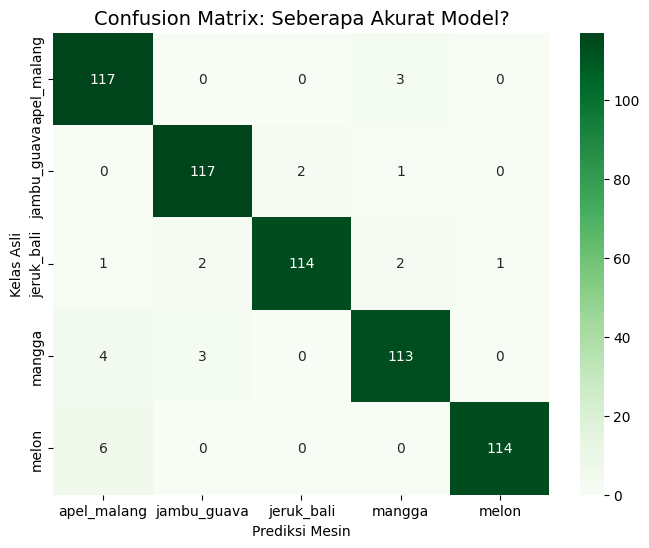



2. BEDAH FITUR: APA YANG DILIHAT MESIN?


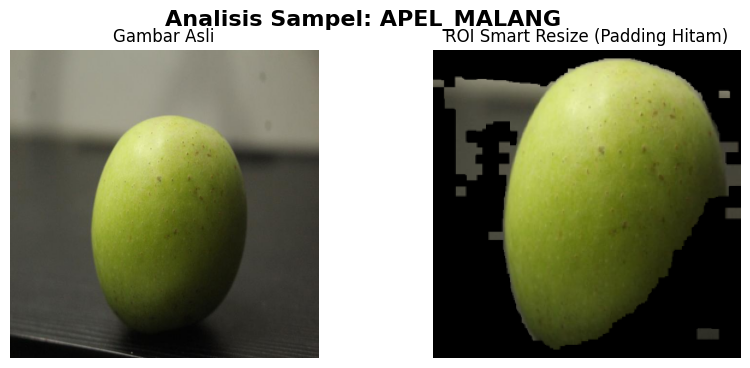

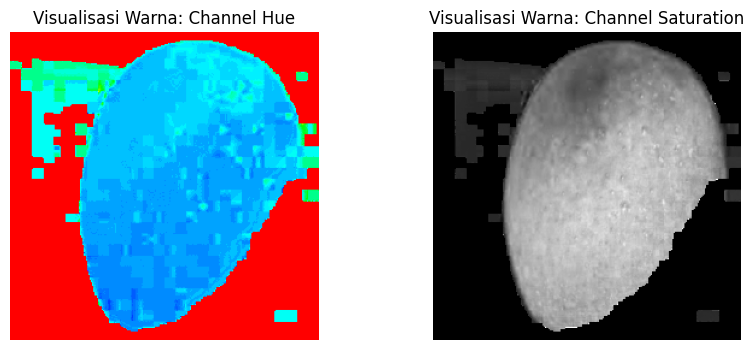

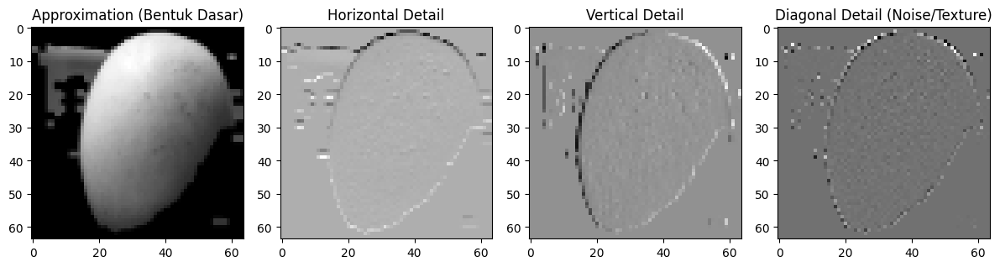

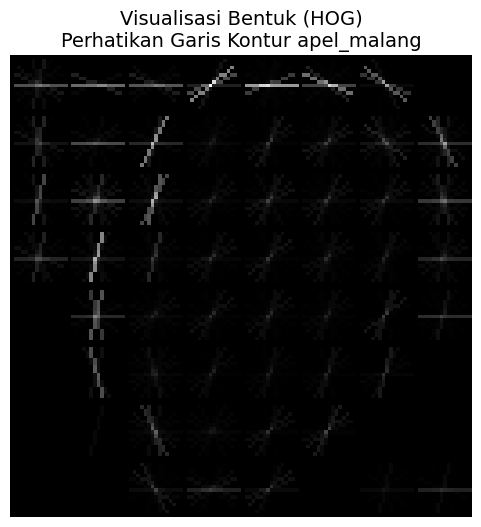

In [ ]:
# =================================================================
# VISUALISASI HASIL & BEDAH FITUR (Jalankan setelah Training)
# =================================================================

import matplotlib.pyplot as plt
import seaborn as sns
import random

# BAGIAN 1: VISUALISASI PERFORMA MODEL (CONFUSION MATRIX)
# -------------------------------------------------------
print("1. EVALUASI MODEL (CONFUSION MATRIX)")
y_pred = best_svm.predict(X_test)

plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix: Seberapa Akurat Model?', fontsize=14)
plt.xlabel('Prediksi Mesin')
plt.ylabel('Kelas Asli')
plt.show()

print("\n" + "="*60 + "\n")

# BAGIAN 2: VISUALISASI EKSTRAKSI FITUR (PER SAMPEL)
# -------------------------------------------------------
print("2. BEDAH FITUR: APA YANG DILIHAT MESIN?")

# Ambil 1 gambar acak dari dataset untuk dibedah
all_images = glob.glob(os.path.join(base_path, "*", "*.jpg"))
if len(all_images) > 0:
    sample_path = random.choice(all_images)
    original_img = cv2.imread(sample_path)
    true_label = os.path.basename(os.path.dirname(sample_path))

    # A. PREPROCESSING (SMART RESIZE & PADDING)
    # Kita lihat bagaimana Padding menjaga bentuk buah
    roi = preprocess_image(original_img) # Ini memanggil resize_with_padding

    plt.figure(figsize=(10, 4))
    plt.suptitle(f"Analisis Sampel: {true_label.upper()}", fontsize=16, fontweight='bold')

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.title("Gambar Asli")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))
    plt.title("ROI Smart Resize (Padding Hitam)")
    plt.axis('off')
    plt.show()

    # B. VISUALISASI FITUR WARNA (CHANNEL H & S)
    # Mesin melihat statistik dari channel ini
    hsv = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(h, cmap='hsv')
    plt.title("Visualisasi Warna: Channel Hue")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(s, cmap='gray') # S-channel biasanya grayscale
    plt.title("Visualisasi Warna: Channel Saturation")
    plt.axis('off')
    plt.show()

    # C. VISUALISASI TEKSTUR (WAVELET / DWT)
    # Mesin melihat kasar/halus dari sini
    coeffs = pywt.wavedec2(v, 'haar', level=2) # Level 2 visualisasi cukup
    LL, (LH, HL, HH) = coeffs[0], coeffs[1]

    plt.figure(figsize=(12, 3))
    plt.subplot(1, 4, 1); plt.imshow(LL, cmap='gray'); plt.title("Approximation (Bentuk Dasar)")
    plt.subplot(1, 4, 2); plt.imshow(LH, cmap='gray'); plt.title("Horizontal Detail")
    plt.subplot(1, 4, 3); plt.imshow(HL, cmap='gray'); plt.title("Vertical Detail")
    plt.subplot(1, 4, 4); plt.imshow(HH, cmap='gray'); plt.title("Diagonal Detail (Noise/Texture)")
    plt.tight_layout()
    plt.show()

    # D. VISUALISASI BENTUK (HOG)
    # Ini kunci membedakan Mangga vs Guava
    # Kita perlu compute ulang HOG dengan visualize=True
    img_resized = cv2.resize(roi, (128, 128))
    gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    _, hog_image = hog(gray, orientations=9, pixels_per_cell=(16, 16),
                       cells_per_block=(2, 2), visualize=True, block_norm='L2-Hys')

    plt.figure(figsize=(6, 6))
    plt.imshow(hog_image, cmap='gray')
    plt.title(f"Visualisasi Bentuk (HOG)\nPerhatikan Garis Kontur {true_label}", fontsize=14)
    plt.axis('off')
    plt.show()

else:
    print("Tidak ada gambar ditemukan untuk divisualisasikan.")

Memuat model...
✅ Sukses memuat Model & Scaler (Versi Smart Resize)!
   SISTEM PREDIKSI HYBRID
   (Paper + HOG + Smart Resize)
1. 📸 Kamera (Real-time)
2. 📂 Upload File
Pilih (1/2): 2

📂 Silakan upload file gambar (JPG/PNG)...


Saving WhatsApp Image 2025-11-24 at 13.49.46.jpeg to WhatsApp Image 2025-11-24 at 13.49.46 (2).jpeg

Memproses file: WhatsApp Image 2025-11-24 at 13.49.46 (2).jpeg...


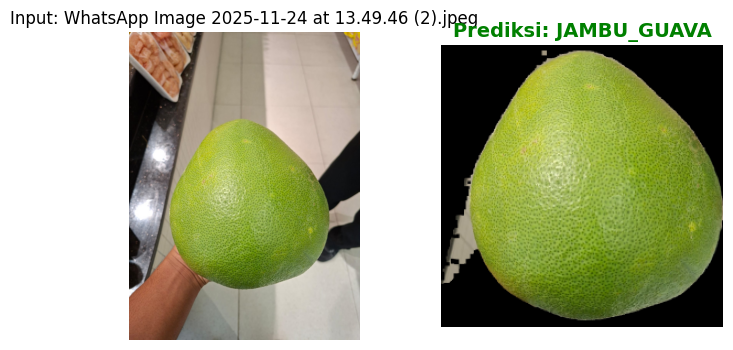

✅ Hasil Deteksi: JAMBU_GUAVA


In [ ]:
# ====================================================================
# FILE 3 — PREDIKSI 2 MODE (KAMERA & UPLOAD) - HYBRID SMART RESIZE
# ====================================================================

import cv2
import numpy as np
import joblib
import pywt
import os
import io
import base64
from scipy.stats import skew, kurtosis
from skimage.feature import graycomatrix, graycoprops, hog
import matplotlib.pyplot as plt
from google.colab import output, files
from PIL import Image

# 1. KONFIGURASI PATH
base_path = "/content/drive/MyDrive/Dataset-PCVK-Kelompok-2"
class_names = ['apel_malang', 'jambu_guava', 'jeruk_bali', 'mangga', 'melon']

# 2. LOAD MODEL & SCALER
# Pastikan nama file sesuai dengan yang disimpan saat training terakhir
try:
    print("Memuat model...")
    svm_model = joblib.load(os.path.join(base_path, 'model_svm_smart.pkl'))
    scaler = joblib.load(os.path.join(base_path, 'scaler_smart.pkl'))
    print("✅ Sukses memuat Model & Scaler (Versi Smart Resize)!")
except Exception as e:
    print(f"❌ ERROR: {e}")
    print("Pastikan Anda sudah menjalankan training 'Smart Resize' dan file .pkl ada di Drive.")
    # Stop eksekusi jika model tidak ada
    raise SystemExit("Model tidak ditemukan.")

# 3. FUNGSI PREPROCESSING & EKSTRAKSI (WAJIB SAMA DENGAN TRAINING)

def resize_with_padding(image, target_size=(256, 256)):
    """Agar bentuk buah tidak gepeng/lebar"""
    h, w = image.shape[:2]
    target_w, target_h = target_size
    scale = min(target_w/w, target_h/h)
    new_w, new_h = int(w * scale), int(h * scale)
    resized = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)
    canvas = np.zeros((target_h, target_w, 3), dtype=np.uint8)
    x_offset, y_offset = (target_w - new_w) // 2, (target_h - new_h) // 2
    canvas[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = resized
    return canvas

def preprocess_image(image):
    """
    VERSI KETAT: Hanya ambil warna Hijau/Kuning.
    Tangan, Lantai, dan Rak akan dibuang (jadi hitam).
    """
    # 1. Convert ke HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # 2. Definisikan Range Warna Buah (Hijau kekuningan sampai Hijau tua)
    # Hue 20-90 mencakup Jeruk Bali, Mangga, Melon, Guava, Apel Malang
    lower_fruit = np.array([20, 40, 40])
    upper_fruit = np.array([90, 255, 255])

    # 3. Buat Masking Warna
    mask = cv2.inRange(hsv, lower_fruit, upper_fruit)

    # 4. Bersihkan noise (bintik-bintik kecil)
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)

    # 5. Cari Kontur Terbesar (Buah)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        largest_contour = max(contours, key=cv2.contourArea)

        # Filter: Jika kontur terlalu kecil (misal cuma bintik sampah), abaikan
        if cv2.contourArea(largest_contour) > 500:
            x, y, w, h_rect = cv2.boundingRect(largest_contour)

            # Crop ROI dari gambar asli
            roi = image[y:y+h_rect, x:x+w]

            # Terapkan mask ke ROI agar background di dalam kotak jadi hitam pekat
            # (Ini langkah krusial untuk membuang tangan yang mungkin ikut ter-crop)
            mask_roi = mask[y:y+h_rect, x:x+w]
            roi_masked = cv2.bitwise_and(roi, roi, mask=mask_roi)

            return resize_with_padding(roi_masked, (256, 256))

    # Jika gagal deteksi warna hijau, kembalikan gambar kosong/hitam atau resize biasa
    return resize_with_padding(image, (256, 256))

def get_color_stats(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, _ = cv2.split(hsv)
    features = []
    for channel in [h, s]:
        features.extend([np.mean(channel), np.std(channel), skew(channel.flatten()), kurtosis(channel.flatten())])
    return np.array(features)

def get_texture_features(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    _, _, v = cv2.split(hsv)
    coeffs = pywt.wavedec2(v, 'haar', level=3)
    LL1 = pywt.wavedec2(v, 'haar', level=1)[0]
    LL1_norm = cv2.normalize(LL1, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    glcm = graycomatrix(LL1_norm, distances=[1, 2], angles=[0, np.pi/4, np.pi/2], levels=256, symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast').mean()
    energy = graycoprops(glcm, 'energy').mean()
    homogeneity = graycoprops(glcm, 'homogeneity').mean()
    shades, prominences = [], []
    for i in range(glcm.shape[2]):
        for j in range(glcm.shape[3]):
            matrix = glcm[:, :, i, j]
            N = matrix.shape[0]
            r, c = np.meshgrid(np.arange(N), np.arange(N), indexing='ij')
            mean_i, mean_j = np.sum(r * matrix), np.sum(c * matrix)
            term = (r + c - mean_i - mean_j)
            shades.append(np.sum((term ** 3) * matrix))
            prominences.append(np.sum((term ** 4) * matrix))
    wavelet_std = [np.std(coeffs[0])]
    for level in coeffs[1:]:
        wavelet_std.extend([np.std(c) for c in level])
    return np.array([contrast, energy, homogeneity, np.mean(shades), np.mean(prominences)] + wavelet_std)

def get_hog_features(image):
    # PENTING: Resize ke 128x128 untuk HOG, sama seperti training
    img_resized = cv2.resize(image, (128, 128))
    gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    fd = hog(gray, orientations=9, pixels_per_cell=(16, 16),
             cells_per_block=(2, 2), visualize=False, block_norm='L2-Hys')
    return fd

def extract_features_hybrid(image):
    """Pipeline Gabungan: Warna + Tekstur + HOG"""
    roi = preprocess_image(image)

    # 1. Fitur Paper (Warna & Tekstur)
    color_feats = get_color_stats(roi)
    texture_feats = get_texture_features(roi)

    # 2. Fitur HOG (Bentuk)
    hog_feats = get_hog_features(roi)

    # Gabungkan semua (Total harus 1787 fitur)
    return np.hstack([color_feats, texture_feats, hog_feats]), roi

# 4. FUNGSI PREDIKSI & TAMPILKAN
def predict_and_show(img_np, source="Gambar"):
    try:
        # Ekstraksi Fitur
        raw_features, roi_img = extract_features_hybrid(img_np)

        # Handle NaN
        if np.any(np.isnan(raw_features)):
            raw_features = np.nan_to_num(raw_features)

        # Scaling (Normalisasi)
        scaled_features = scaler.transform(raw_features.reshape(1, -1))

        # Prediksi
        pred_idx = svm_model.predict(scaled_features)[0]
        pred_label = class_names[pred_idx]

        # Visualisasi
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(img_np, cv2.COLOR_BGR2RGB))
        plt.title(f"Input: {source}")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(roi_img, cv2.COLOR_BGR2RGB))
        plt.title(f"Prediksi: {pred_label.upper()}", color='green', fontweight='bold', fontsize=14)
        plt.axis('off')
        plt.show()

        print(f"✅ Hasil Deteksi: {pred_label.upper()}")

    except Exception as e:
        print(f"❌ Error Prediksi: {e}")

# 5. HANDLER KAMERA & UPLOAD

def get_photo_callback(data):
    try:
        header, encoded = data.split(",", 1)
        img_bytes = io.BytesIO(base64.b64decode(encoded))
        img = Image.open(img_bytes)
        img_np = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
        predict_and_show(img_np, source="Kamera")
    except Exception as e:
        print(f"Error Kamera: {e}")

output.register_callback('notebook.getPhoto', get_photo_callback)

def run_camera_mode():
    js = """
    async function takePhoto() {
      const div = document.createElement('div');
      const video = document.createElement('video');
      const btn = document.createElement('button');
      video.style.display = 'block';
      btn.textContent = 'KLIK UNTUK AMBIL FOTO';
      div.appendChild(video); div.appendChild(btn);
      document.body.appendChild(div);
      const stream = await navigator.mediaDevices.getUserMedia({ video: true });
      video.srcObject = stream;
      await video.play();
      await new Promise((resolve) => btn.onclick = resolve);
      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth; canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getTracks().forEach(t => t.stop());
      div.remove();
      const data = canvas.toDataURL('image/jpeg');
      google.colab.kernel.invokeFunction('notebook.getPhoto', [data], {});
    }
    """
    output.eval_js(js)
    output.eval_js('takePhoto()')

def run_upload_mode():
    print("\n📂 Silakan upload file gambar (JPG/PNG)...")
    uploaded = files.upload()
    for fn in uploaded.keys():
        print(f'\nMemproses file: {fn}...')
        nparr = np.frombuffer(uploaded[fn], np.uint8)
        img_np = cv2.imdecode(nparr, cv2.IMREAD_COLOR)
        if img_np is not None:
            predict_and_show(img_np, source=fn)
        else:
            print("Gagal membaca gambar.")

# 6. MENU
print("="*30)
print("   SISTEM PREDIKSI HYBRID")
print("   (Paper + HOG + Smart Resize)")
print("="*30)
print("1. 📸 Kamera (Real-time)")
print("2. 📂 Upload File")
choice = input("Pilih (1/2): ")

if choice == '1': run_camera_mode()
elif choice == '2': run_upload_mode()
else: print("Pilihan salah.")

 # Ver 4



Mulai Training 'Ultimate Hybrid'...
  Memproses apel_malang...


C:\Users\ASUS\AppData\Local\Temp\ipykernel_20644\4160993973.py:159: UserWarning: Argument(s) 'value' are not valid for transform Rotate
  A.Rotate(limit=90, p=1.0, border_mode=cv2.BORDER_CONSTANT, value=0),


  Memproses jambu_guava...
  Memproses jeruk_bali...
  Memproses mangga...
  Memproses melon...
Total Data Latih: 3000
Melatih SVM...
Fitting 3 folds for each of 12 candidates, totalling 36 fits
✅ Model Tersimpan!

=== VISUALISASI HASIL & FITUR ===


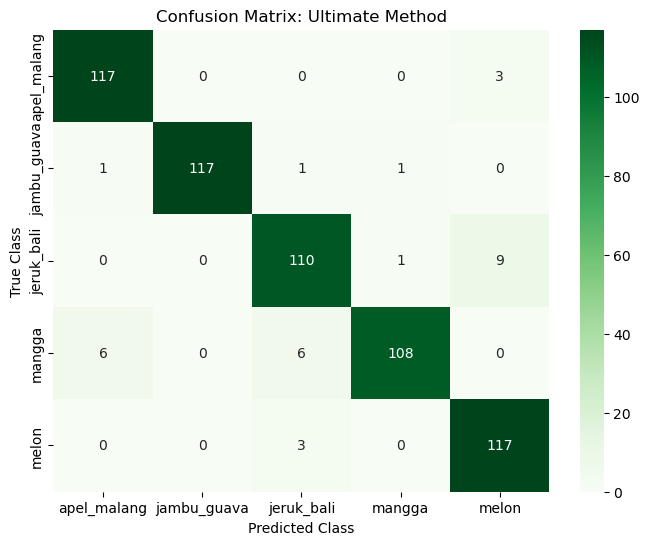

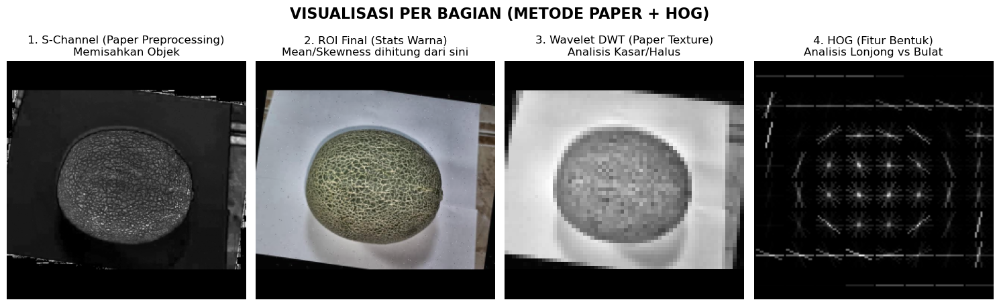

In [2]:
# ==================================================================================
# ULTIMATE HYBRID PIPELINE: PAPER + HOG + CLAHE + SMART RESIZE
# ==================================================================================

import cv2
import numpy as np
import os
import glob
import pywt
import joblib
import albumentations as A
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis
from skimage.feature import graycomatrix, graycoprops, hog
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import pandas as pd

# 1. KONFIGURASI
base_path = "dataset"
class_names = ['apel_malang', 'jambu_guava', 'jeruk_bali', 'mangga', 'melon']
class_to_id = {name: idx for idx, name in enumerate(class_names)}

# ==========================================
# A. PREPROCESSING (VISUAL + TEXTURE ENHANCER)
# ==========================================

def apply_clahe(image):
    """Meningkatkan kontras lokal agar tekstur pori-pori terlihat jelas."""
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl,a,b))
    return cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

def resize_with_padding(image, target_size=(256, 256)):
    """Resize dengan padding hitam (Letterbox) agar rasio bentuk terjaga."""
    h, w = image.shape[:2]
    target_w, target_h = target_size
    scale = min(target_w/w, target_h/h)
    new_w, new_h = int(w * scale), int(h * scale)
    resized = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)
    canvas = np.zeros((target_h, target_w, 3), dtype=np.uint8)
    x_offset, y_offset = (target_w - new_w) // 2, (target_h - new_h) // 2
    canvas[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = resized
    return canvas

def preprocess_image(image):
    """
    Kombinasi Metode Paper (S-Channel Thresholding)
    dengan CLAHE dan Strict Masking.
    """
    # 1. Enhance Texture
    image = apply_clahe(image)

    # 2. Convert HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # 3. Strict Masking (Hanya Hijau & Kuning Buah)
    lower = np.array([20, 50, 40])
    upper = np.array([95, 255, 255])
    mask = cv2.inRange(hsv, lower, upper)

    # 4. Clean Noise
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)

    # 5. Crop ROI
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        if cv2.contourArea(largest_contour) > 1000:
            x, y, w, h_rect = cv2.boundingRect(largest_contour)
            roi = image[y:y+h_rect, x:x+w]
            mask_roi = mask[y:y+h_rect, x:x+w]
            roi = cv2.bitwise_and(roi, roi, mask=mask_roi) # Background Hitam Pekat
            return resize_with_padding(roi, (256, 256))

    return resize_with_padding(image, (256, 256))

# ==========================================
# B. FEATURE EXTRACTION (PAPER + HOG)
# ==========================================

def get_color_stats(image):
    """Fitur Paper: Statistik H & S (Mean, Std, Skew, Kurt) [cite: 103]"""
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, _ = cv2.split(hsv)
    features = []
    for channel in [h, s]:
        features.extend([np.mean(channel), np.std(channel), skew(channel.flatten()), kurtosis(channel.flatten())])
    return np.array(features)

def get_texture_features(image):
    """Fitur Paper: Wavelet DWT Level 3 + GLCM """
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    _, _, v = cv2.split(hsv) # V channel untuk tekstur

    # Wavelet Decomposition
    coeffs = pywt.wavedec2(v, 'haar', level=3)

    # GLCM pada Approximation Level 1 (Sesuai Paper)
    LL1 = pywt.wavedec2(v, 'haar', level=1)[0]
    LL1_norm = cv2.normalize(LL1, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    glcm = graycomatrix(LL1_norm, distances=[1, 3], angles=[0, np.pi/4, np.pi/2], levels=256, symmetric=True, normed=True)

    # Fitur GLCM Standard
    contrast = graycoprops(glcm, 'contrast').mean()
    energy = graycoprops(glcm, 'energy').mean()
    homogeneity = graycoprops(glcm, 'homogeneity').mean()

    # Fitur GLCM Lanjutan (Cluster Shade & Prominence) [cite: 117-118]
    shades, prominences = [], []
    for i in range(glcm.shape[2]):
        for j in range(glcm.shape[3]):
            matrix = glcm[:, :, i, j]
            N = matrix.shape[0]
            r, c = np.meshgrid(np.arange(N), np.arange(N), indexing='ij')
            mean_i, mean_j = np.sum(r * matrix), np.sum(c * matrix)
            term = (r + c - mean_i - mean_j)
            shades.append(np.sum((term ** 3) * matrix))
            prominences.append(np.sum((term ** 4) * matrix))

    # Std Dev Wavelet Details [cite: 113]
    wavelet_std = [np.std(coeffs[0])]
    for level in coeffs[1:]:
        wavelet_std.extend([np.std(c) for c in level])

    return np.array([contrast, energy, homogeneity, np.mean(shades), np.mean(prominences)] + wavelet_std)

def get_hog_features(image):
    """Fitur Tambahan: HOG untuk Bentuk (Mangga vs Guava)"""
    img_resized = cv2.resize(image, (128, 128))
    gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    fd = hog(gray, orientations=9, pixels_per_cell=(16, 16),
             cells_per_block=(2, 2), visualize=False, block_norm='L2-Hys')
    return fd

def extract_features_ultimate(image):
    roi = preprocess_image(image)
    return np.hstack([
        get_color_stats(roi),
        get_texture_features(roi),
        get_hog_features(roi)
    ])

# ==========================================
# C. TRAINING LOOP (AUGMENTASI & SVM)
# ==========================================

def setup_augmentations():
    return A.Compose([
        A.Rotate(limit=90, p=1.0, border_mode=cv2.BORDER_CONSTANT, value=0),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.5)
    ])

print("\nMulai Training 'Ultimate Hybrid'...")
X, y = [], []
augmentor = setup_augmentations()
N_AUGMENTATIONS = 3

for class_name in class_names:
    folder = os.path.join(base_path, class_name)
    if not os.path.exists(folder): continue

    img_paths = glob.glob(os.path.join(folder, "*"))
    print(f"  Memproses {class_name}...")

    for path in img_paths:
        img = cv2.imread(path)
        if img is None: continue

        # Original
        feats = extract_features_ultimate(img)
        if np.any(np.isnan(feats)): feats = np.nan_to_num(feats)
        X.append(feats); y.append(class_to_id[class_name])

        # Augmentasi
        for _ in range(N_AUGMENTATIONS):
            aug = augmentor(image=img)['image']
            feats_aug = extract_features_ultimate(aug)
            if np.any(np.isnan(feats_aug)): feats_aug = np.nan_to_num(feats_aug)
            X.append(feats_aug); y.append(class_to_id[class_name])

X = np.array(X)
y = np.array(y)
print(f"Total Data Latih: {len(X)}")

# Normalisasi & Split
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42, stratify=y)

# SVM Training
print("Melatih SVM...")
grid = GridSearchCV(SVC(), {'C': [1, 10, 100], 'gamma': ['scale', 'auto'], 'kernel': ['rbf', 'linear']}, cv=3, verbose=1, n_jobs=1)
grid.fit(X_train, y_train)
best_svm = grid.best_estimator_

# Save
joblib.dump(best_svm, os.path.join(base_path, 'model_svm_ultimate.pkl'))
joblib.dump(scaler, os.path.join(base_path, 'scaler_ultimate.pkl'))
print("✅ Model Tersimpan!")

# ==========================================
# D. VISUALISASI HASIL PER BAGIAN
# ==========================================

print("\n=== VISUALISASI HASIL & FITUR ===")

# 1. Confusion Matrix
y_pred = best_svm.predict(X_test)
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Greens', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix: Ultimate Method')
plt.ylabel('True Class'); plt.xlabel('Predicted Class')
plt.show()

# 2. Visualisasi Per Bagian (Warna, Tekstur, Bentuk)
import random
sample_path = random.choice(glob.glob(os.path.join(base_path, "*", "*.jpg")))
img_sample = cv2.imread(sample_path)
roi_sample = preprocess_image(img_sample)

plt.figure(figsize=(15, 5))
plt.suptitle("VISUALISASI PER BAGIAN (METODE PAPER + HOG)", fontsize=16, fontweight='bold')

# Bagian 1: Preprocessing (S-Channel) [cite: 60]
plt.subplot(1, 4, 1)
hsv = cv2.cvtColor(roi_sample, cv2.COLOR_BGR2HSV)
plt.imshow(hsv[:,:,1], cmap='gray')
plt.title("1. S-Channel (Paper Preprocessing)\nMemisahkan Objek")
plt.axis('off')

# Bagian 2: Warna (Stats) [cite: 102]
plt.subplot(1, 4, 2)
plt.imshow(cv2.cvtColor(roi_sample, cv2.COLOR_BGR2RGB))
plt.title("2. ROI Final (Stats Warna)\nMean/Skewness dihitung dari sini")
plt.axis('off')

# Bagian 3: Tekstur (Wavelet) [cite: 107]
_, _, v = cv2.split(hsv)
coeffs = pywt.wavedec2(v, 'haar', level=2)
plt.subplot(1, 4, 3)
plt.imshow(coeffs[0], cmap='gray') # Approximation
plt.title("3. Wavelet DWT (Paper Texture)\nAnalisis Kasar/Halus")
plt.axis('off')

# Bagian 4: Bentuk (HOG) - Tambahan Modern
img_resized = cv2.resize(roi_sample, (128, 128))
_, hog_viz = hog(cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY), orientations=9, pixels_per_cell=(16, 16), cells_per_block=(2, 2), visualize=True)
plt.subplot(1, 4, 4)
plt.imshow(hog_viz, cmap='gray')
plt.title("4. HOG (Fitur Bentuk)\nAnalisis Lonjong vs Bulat")
plt.axis('off')

plt.tight_layout()
plt.show()

In [1]:
import cv2
import numpy as np
import joblib
import pywt
import os
from scipy.stats import skew, kurtosis
from skimage.feature import graycomatrix, graycoprops, hog

# =====================================================================
# 1. LOAD MODEL
# =====================================================================
base_path = "dataset"
class_names = ['apel_malang', 'jambu_guava', 'jeruk_bali', 'mangga', 'melon']

print("Memuat Model Ultimate...")
try:
    svm_model = joblib.load(os.path.join(base_path, 'model_svm_ultimate.pkl'))
    scaler = joblib.load(os.path.join(base_path, 'scaler_ultimate.pkl'))
    print("✅ SUKSES: Model Loaded!")
except Exception as e:
    print(f"❌ ERROR LOAD MODEL: {e}")
    exit()


# =====================================================================
# 2. PREPROCESSING
# =====================================================================

def apply_clahe(image):
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    merged = cv2.merge((cl, a, b))
    return cv2.cvtColor(merged, cv2.COLOR_LAB2BGR)

def resize_with_padding(image, target_size=(256, 256)):
    h, w = image.shape[:2]
    th, tw = target_size
    scale = min(tw/w, th/h)
    new_w, new_h = int(w * scale), int(h * scale)

    resized = cv2.resize(image, (new_w, new_h))
    canvas = np.zeros((th, tw, 3), dtype=np.uint8)

    x_offset = (tw - new_w) // 2
    y_offset = (th - new_h) // 2

    canvas[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = resized
    return canvas

def preprocess_image(image):
    image = apply_clahe(image)

    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lower = np.array([20, 50, 40])
    upper = np.array([95, 255, 255])
    mask = cv2.inRange(hsv, lower, upper)

    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        c = max(contours, key=cv2.contourArea)
        if cv2.contourArea(c) > 1000:
            x, y, w, h = cv2.boundingRect(c)
            roi = image[y:y+h, x:x+w]
            mask_roi = mask[y:y+h, x:x+w]
            roi = cv2.bitwise_and(roi, roi, mask=mask_roi)
            return resize_with_padding(roi)

    return resize_with_padding(image)


# =====================================================================
# 3. EKSTRAKSI FITUR
# =====================================================================

def get_color_stats(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, _ = cv2.split(hsv)

    features = []
    for ch in [h, s]:
        features.extend([
            np.mean(ch), np.std(ch),
            skew(ch.flatten()), kurtosis(ch.flatten())
        ])
    return np.array(features)

def get_texture_features(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    _, _, v = cv2.split(hsv)

    coeffs = pywt.wavedec2(v, 'haar', level=3)
    LL1 = pywt.wavedec2(v, 'haar', level=1)[0]
    LL1_norm = cv2.normalize(LL1, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    glcm = graycomatrix(LL1_norm, distances=[1, 3], angles=[0, np.pi/4, np.pi/2],
                        levels=256, symmetric=True, normed=True)

    contrast = graycoprops(glcm, 'contrast').mean()
    energy = graycoprops(glcm, 'energy').mean()
    homogeneity = graycoprops(glcm, 'homogeneity').mean()

    return np.array([contrast, energy, homogeneity])

def get_hog_features(image):
    img_resized = cv2.resize(image, (128, 128))
    gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)

    return hog(gray, orientations=9, pixels_per_cell=(16, 16),
               cells_per_block=(2, 2), visualize=False,
               block_norm='L2-Hys')

def extract_features_ultimate(image):
    roi = preprocess_image(image)
    return np.hstack([
        get_color_stats(roi),
        get_texture_features(roi),
        get_hog_features(roi)
    ]), roi


# =====================================================================
# 4. RUN WEBCAM REALTIME (OpenCV)
# =====================================================================

def run_webcam():
    cap = cv2.VideoCapture(0, cv2.CAP_DSHOW)

    if not cap.isOpened():
        print("❌ Tidak bisa mengakses kamera.")
        return

    print("🎥 Kamera Aktif. Tekan 'q' untuk keluar.")

    while True:
        ret, frame = cap.read()
        if not ret:
            print("❌ Frame tidak terbaca.")
            break

        try:
            feats, roi = extract_features_ultimate(frame)
            feats = np.nan_to_num(feats)
            scaled = scaler.transform(feats.reshape(1, -1))
            pred = svm_model.predict(scaled)[0]
            label = class_names[pred]
        except:
            label = "Tidak Terdeteksi"

        cv2.putText(frame, f"Prediksi: {label}", (20, 40),
                    cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0,255,0), 2)

        cv2.imshow("Deteksi Buah Ultimate", frame)

        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    cap.release()
    cv2.destroyAllWindows()

# RUNNING
run_webcam()


Memuat Model Ultimate...
✅ SUKSES: Model Loaded!
🎥 Kamera Aktif. Tekan 'q' untuk keluar.


error: OpenCV(4.12.0) D:\a\opencv-python\opencv-python\opencv\modules\highgui\src\window.cpp:1301: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvShowImage'


✅ Model Siap!

📸 Silakan klik AMBIL FOTO di bawah...


<IPython.core.display.Javascript object>

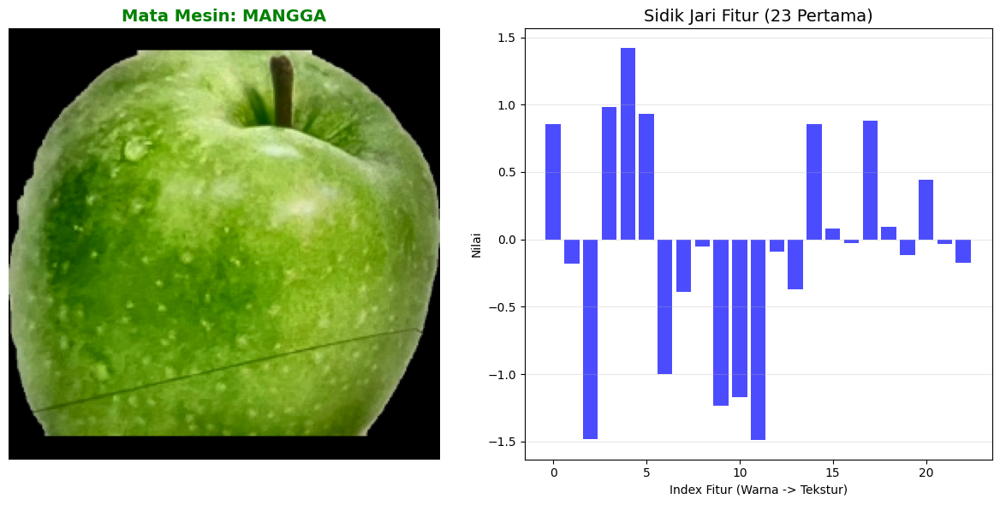

In [ ]:
# =========================================================
# VISUALISASI LITE: SIDIK JARI BUAH (FIXED)
# =========================================================

import cv2
import numpy as np
import joblib
import pywt
import os
import io
import base64
import matplotlib.pyplot as plt
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode
from scipy.stats import skew, kurtosis
from skimage.feature import graycomatrix, graycoprops, hog

# 1. FUNGSI KAMERA (YANG TADI HILANG)
def take_photo(filename='photo.jpg', quality=0.8):
    js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'AMBIL FOTO';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
        f.write(binary)
    return filename

# 2. FUNGSI PENDUKUNG (Resize, CLAHE, Preprocess)
def resize_with_padding(image, target_size=(256, 256)):
    h, w = image.shape[:2]
    target_w, target_h = target_size
    scale = min(target_w/w, target_h/h)
    new_w, new_h = int(w * scale), int(h * scale)
    resized = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)
    canvas = np.zeros((target_h, target_w, 3), dtype=np.uint8)
    x_offset, y_offset = (target_w - new_w) // 2, (target_h - new_h) // 2
    canvas[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = resized
    return canvas

def apply_clahe(image):
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl,a,b))
    return cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

def preprocess_image(image):
    image = apply_clahe(image)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lower = np.array([20, 50, 40])
    upper = np.array([95, 255, 255])
    mask = cv2.inRange(hsv, lower, upper)
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        if cv2.contourArea(largest_contour) > 1000:
            x, y, w, h_rect = cv2.boundingRect(largest_contour)
            roi = image[y:y+h_rect, x:x+w]
            mask_roi = mask[y:y+h_rect, x:x+w]
            roi = cv2.bitwise_and(roi, roi, mask=mask_roi)
            return resize_with_padding(roi, (256, 256))
    return resize_with_padding(image, (256, 256))

def extract_features_ultimate_lite(image):
    roi = preprocess_image(image)
    # Warna
    hsv = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
    h, s, _ = cv2.split(hsv)
    color_feats = []
    for channel in [h, s]:
        color_feats.extend([np.mean(channel), np.std(channel), skew(channel.flatten()), kurtosis(channel.flatten())])
    # Tekstur
    _, _, v = cv2.split(hsv)
    coeffs = pywt.wavedec2(v, 'haar', level=3)
    LL1 = pywt.wavedec2(v, 'haar', level=1)[0]
    LL1_norm = cv2.normalize(LL1, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    glcm = graycomatrix(LL1_norm, distances=[1, 3], angles=[0, np.pi/4, np.pi/2], levels=256, symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast').mean()
    energy = graycoprops(glcm, 'energy').mean()
    homogeneity = graycoprops(glcm, 'homogeneity').mean()
    shades, prominences = [], []
    for i in range(glcm.shape[2]):
        for j in range(glcm.shape[3]):
            matrix = glcm[:, :, i, j]
            N = matrix.shape[0]
            r, c = np.meshgrid(np.arange(N), np.arange(N), indexing='ij')
            mean_i, mean_j = np.sum(r * matrix), np.sum(c * matrix)
            term = (r + c - mean_i - mean_j)
            shades.append(np.sum((term ** 3) * matrix))
            prominences.append(np.sum((term ** 4) * matrix))
    wavelet_std = [np.std(coeffs[0])]
    for level in coeffs[1:]:
        wavelet_std.extend([np.std(c) for c in level])
    # HOG
    img_resized = cv2.resize(roi, (128, 128))
    gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    hog_feats = hog(gray, orientations=9, pixels_per_cell=(16, 16),
             cells_per_block=(2, 2), visualize=False, block_norm='L2-Hys')

    return np.hstack([color_feats, [contrast, energy, homogeneity, np.mean(shades), np.mean(prominences)], wavelet_std, hog_feats]), roi

# 3. LOAD MODEL
base_path = "/content/drive/MyDrive/Dataset-PCVK-Kelompok-2"
class_names = ['apel_malang', 'jambu_guava', 'jeruk_bali', 'mangga', 'melon']
try:
    svm_model = joblib.load(os.path.join(base_path, 'model_svm_ultimate.pkl'))
    scaler = joblib.load(os.path.join(base_path, 'scaler_ultimate.pkl'))
    print("✅ Model Siap!")
except:
    print("⚠️ Model belum ketemu, pastikan sudah training.")

# 4. EKSEKUSI
print("\n📸 Silakan klik AMBIL FOTO di bawah...")
try:
    photo_path = take_photo()
    img = cv2.imread(photo_path)

    if img is not None:
        raw_feats, roi = extract_features_ultimate_lite(img)
        if np.any(np.isnan(raw_feats)): raw_feats = np.nan_to_num(raw_feats)

        scaled_feats = scaler.transform(raw_feats.reshape(1, -1))
        input_vector = scaled_feats[0]

        pred_idx = svm_model.predict(scaled_feats)[0]
        pred_class = class_names[pred_idx]

        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))
        plt.title(f"Mata Mesin: {pred_class.upper()}", fontsize=14, fontweight='bold', color='green')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        indices = np.arange(len(input_vector))
        limit_plot = 23
        plt.bar(indices[:limit_plot], input_vector[:limit_plot], color='blue', alpha=0.7)
        plt.title("Sidik Jari Fitur (23 Pertama)", fontsize=14)
        plt.xlabel("Index Fitur (Warna -> Tekstur)")
        plt.ylabel("Nilai")
        plt.grid(axis='y', alpha=0.3)
        plt.tight_layout()
        plt.show()
except Exception as e:
    print(f"Error: {e}")

🔄 Memuat Model Ultimate...
✅ Model & Scaler Siap!
   SISTEM DETEKSI BUAH ULTIMATE
   (Paper + HOG + CLAHE + Smart Resize)
Pilih Mode:
1. 📸 Kamera Langsung
2. 📂 Upload File
Masukkan angka (1 atau 2): 2

📂 Silakan Upload File Gambar (JPG/PNG)...


Saving Tangkapan Layar 2025-11-29 pukul 13.39.05.png to Tangkapan Layar 2025-11-29 pukul 13.39.05.png
Memproses Tangkapan Layar 2025-11-29 pukul 13.39.05.png...


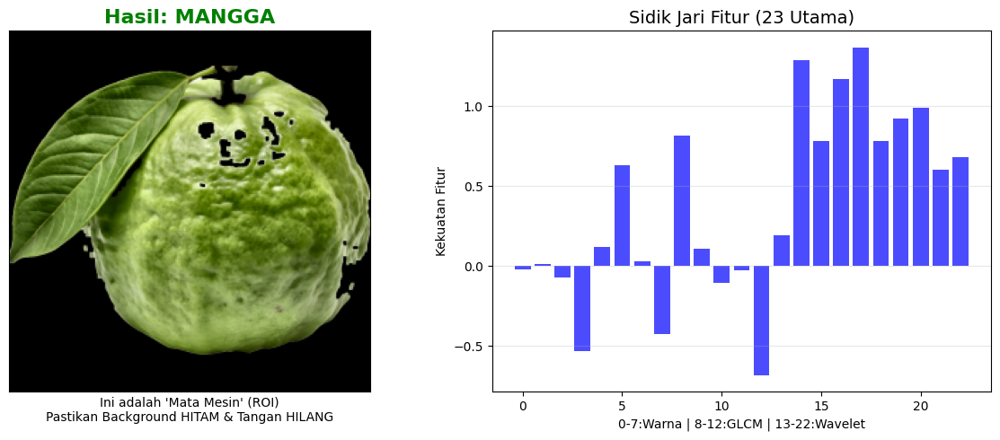


🎯 HASIL DETEKSI: MANGGA


In [ ]:
# ====================================================================
# DETEKSI BUAH ULTIMATE: 2 MODE (KAMERA & UPLOAD)
# ====================================================================

import cv2
import numpy as np
import joblib
import pywt
import os
import io
import base64
from scipy.stats import skew, kurtosis
from skimage.feature import graycomatrix, graycoprops, hog
import matplotlib.pyplot as plt
from IPython.display import display, Javascript
from google.colab import output, files
from PIL import Image

# 1. SETUP & LOAD MODEL
base_path = "/content/drive/MyDrive/Dataset-PCVK-Kelompok-2"
class_names = ['apel_malang', 'jambu_guava', 'jeruk_bali', 'mangga', 'melon']

print("🔄 Memuat Model Ultimate...")
try:
    svm_model = joblib.load(os.path.join(base_path, 'model_svm_ultimate.pkl'))
    scaler = joblib.load(os.path.join(base_path, 'scaler_ultimate.pkl'))
    print("✅ Model & Scaler Siap!")
except:
    print("❌ Error: File model tidak ditemukan. Pastikan sudah training (Ultimate).")

# 2. FUNGSI "DAPUR" (PREPROCESSING & EKSTRAKSI FITUR)
# --- WAJIB SAMA PERSIS DENGAN KODE TRAINING TERAKHIR ---

def resize_with_padding(image, target_size=(256, 256)):
    h, w = image.shape[:2]
    target_w, target_h = target_size
    scale = min(target_w/w, target_h/h)
    new_w, new_h = int(w * scale), int(h * scale)
    resized = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)
    canvas = np.zeros((target_h, target_w, 3), dtype=np.uint8)
    x_offset, y_offset = (target_w - new_w) // 2, (target_h - new_h) // 2
    canvas[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = resized
    return canvas

def apply_clahe(image):
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl,a,b))
    return cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

def preprocess_image(image):
    image = apply_clahe(image) # Penegas Tekstur
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Strict Masking (Hanya Hijau & Kuning)
    lower = np.array([20, 50, 40])
    upper = np.array([95, 255, 255])
    mask = cv2.inRange(hsv, lower, upper)

    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        if cv2.contourArea(largest_contour) > 1000:
            x, y, w, h_rect = cv2.boundingRect(largest_contour)
            roi = image[y:y+h_rect, x:x+w]
            mask_roi = mask[y:y+h_rect, x:x+w]
            roi = cv2.bitwise_and(roi, roi, mask=mask_roi) # Background Hitam
            return resize_with_padding(roi, (256, 256))
    return resize_with_padding(image, (256, 256))

def extract_features_ultimate_lite(image):
    roi = preprocess_image(image)

    # 1. Warna
    hsv = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
    h, s, _ = cv2.split(hsv)
    color_feats = []
    for channel in [h, s]:
        color_feats.extend([np.mean(channel), np.std(channel), skew(channel.flatten()), kurtosis(channel.flatten())])

    # 2. Tekstur (Wavelet + GLCM)
    _, _, v = cv2.split(hsv)
    coeffs = pywt.wavedec2(v, 'haar', level=3)
    LL1 = pywt.wavedec2(v, 'haar', level=1)[0]
    LL1_norm = cv2.normalize(LL1, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    glcm = graycomatrix(LL1_norm, distances=[1, 3], angles=[0, np.pi/4, np.pi/2], levels=256, symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast').mean()
    energy = graycoprops(glcm, 'energy').mean()
    homogeneity = graycoprops(glcm, 'homogeneity').mean()
    shades, prominences = [], []
    for i in range(glcm.shape[2]):
        for j in range(glcm.shape[3]):
            matrix = glcm[:, :, i, j]
            N = matrix.shape[0]
            r, c = np.meshgrid(np.arange(N), np.arange(N), indexing='ij')
            mean_i, mean_j = np.sum(r * matrix), np.sum(c * matrix)
            term = (r + c - mean_i - mean_j)
            shades.append(np.sum((term ** 3) * matrix))
            prominences.append(np.sum((term ** 4) * matrix))
    wavelet_std = [np.std(coeffs[0])]
    for level in coeffs[1:]:
        wavelet_std.extend([np.std(c) for c in level])

    # 3. Bentuk (HOG)
    img_resized = cv2.resize(roi, (128, 128))
    gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    hog_feats = hog(gray, orientations=9, pixels_per_cell=(16, 16),
             cells_per_block=(2, 2), visualize=False, block_norm='L2-Hys')

    return np.hstack([color_feats, [contrast, energy, homogeneity, np.mean(shades), np.mean(prominences)], wavelet_std, hog_feats]), roi

# 3. FUNGSI PREDIKSI & VISUALISASI UTAMA
def predict_and_visualize(image, source_name="Gambar Input"):
    try:
        # Ekstraksi
        raw_feats, roi = extract_features_ultimate_lite(image)
        if np.any(np.isnan(raw_feats)): raw_feats = np.nan_to_num(raw_feats)

        # Scaling
        scaled_feats = scaler.transform(raw_feats.reshape(1, -1))
        input_vector = scaled_feats[0]

        # Prediksi SVM
        pred_idx = svm_model.predict(scaled_feats)[0]
        pred_class = class_names[pred_idx]

        # --- TAMPILKAN HASIL ---
        plt.figure(figsize=(12, 5))

        # Gambar Kiri: Input & ROI
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))
        plt.title(f"Hasil: {pred_class.upper()}", fontsize=16, fontweight='bold', color='green')
        plt.xlabel("Ini adalah 'Mata Mesin' (ROI)\nPastikan Background HITAM & Tangan HILANG")
        plt.xticks([]); plt.yticks([])

        # Gambar Kanan: Grafik Sidik Jari
        plt.subplot(1, 2, 2)
        indices = np.arange(len(input_vector))
        limit_plot = 23 # Tampilkan 23 fitur utama (Warna + Tekstur)
        plt.bar(indices[:limit_plot], input_vector[:limit_plot], color='blue', alpha=0.7)
        plt.title("Sidik Jari Fitur (23 Utama)", fontsize=14)
        plt.xlabel("0-7:Warna | 8-12:GLCM | 13-22:Wavelet")
        plt.ylabel("Kekuatan Fitur")
        plt.grid(axis='y', alpha=0.3)

        plt.tight_layout()
        plt.show()

        print(f"\n🎯 HASIL DETEKSI: {pred_class.upper()}")

    except Exception as e:
        print(f"Error saat prediksi: {e}")

# 4. FUNGSI KAMERA & UPLOAD
def take_photo_js(filename='photo.jpg', quality=0.8):
    js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});
      div.appendChild(video);
      document.body.appendChild(div);
      video.srcObject = stream;
      await video.play();
      // Tambah Tombol
      const btn = document.createElement('button');
      btn.textContent = 'KLIK UNTUK POTRET';
      btn.style.margin = '10px'; btn.style.fontSize = '20px'; btn.style.fontWeight = 'bold';
      div.appendChild(btn);
      await new Promise((resolve) => btn.onclick = resolve);
      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth; canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getTracks().forEach(t => t.stop());
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f: f.write(binary)
    return filename

def run_camera_mode():
    print("\n📸 Menyalakan Kamera... Silakan Klik Tombol di Bawah Video.")
    try:
        path = take_photo_js()
        img = cv2.imread(path)
        predict_and_visualize(img, "Kamera")
    except Exception as e: print(f"Batal/Error: {e}")

def run_upload_mode():
    print("\n📂 Silakan Upload File Gambar (JPG/PNG)...")
    uploaded = files.upload()
    for fn in uploaded.keys():
        print(f"Memproses {fn}...")
        nparr = np.frombuffer(uploaded[fn], np.uint8)
        img = cv2.imdecode(nparr, cv2.IMREAD_COLOR)
        if img is not None:
            predict_and_visualize(img, fn)
        else:
            print("Gagal membaca gambar.")

# 5. MENU UTAMA
print("="*40)
print("   SISTEM DETEKSI BUAH ULTIMATE")
print("   (Paper + HOG + CLAHE + Smart Resize)")
print("="*40)
print("Pilih Mode:")
print("1. 📸 Kamera Langsung")
print("2. 📂 Upload File")
print("="*40)

pilihan = input("Masukkan angka (1 atau 2): ")

if pilihan == '1':
    run_camera_mode()
elif pilihan == '2':
    run_upload_mode()
else:
    print("Pilihan tidak valid. Silakan jalankan ulang sel ini.")